In [266]:
# Data Management/Investigation
import pandas as pd
from pandas.api.types import CategoricalDtype # Ordering categories
import numpy as np
import missingno as miss
from plotnine import *
import seaborn as sns
import matplotlib.pyplot as plt
from adjustText import adjust_text
import folium
import json

# web-scraping
import requests
from bs4 import BeautifulSoup
import html5lib
import PyPDF2 # Scraping PDFs

# misc
import country_converter as coco
import warnings
warnings.filterwarnings("ignore")
from functools import reduce
from datetime import datetime
from datetime import timedelta
from mizani.breaks import date_breaks, minor_breaks
from mizani.formatters import date_format

### Import CoronaNet policy data set 

In [2]:
# read in the CoronaNet data
dat = pd.read_csv("../Data/coronanet_release.csv", encoding = "ISO-8859-1")
# drop unuseful columns
dat = dat.drop(['Unnamed: 0','record_id', "link","recorded_date","ISO_A3","date_updated","date_announced",
                "ISO_A2","correct_type","index_country_rank","index_low_est", "index_high_est"], axis=1)
print(dat.shape)

# check out all of the columns names and data types in the dataset
print(dat.dtypes)

(45391, 28)
policy_id               int64
entry_type             object
update_type            object
update_level           object
description            object
date_start             object
date_end               object
country                object
init_country_level     object
domestic_policy         int64
province               object
city                   object
type                   object
type_sub_cat           object
type_text              object
institution_status     object
target_country         object
target_geog_level      object
target_region          object
target_province        object
target_city            object
target_other          float64
target_who_what        object
target_direction       object
travel_mechanism       object
compliance             object
enforcer               object
index_med_est         float64
dtype: object


In [3]:
# only look at OECD data
oecd = ["AUSTRALIA","AUSTRIA","BELGIUM","CANADA","CHILE","COLOMBIA","CZECH REPUBLIC",
        "DENMARK","ESTONIA","FINLAND","FRANCE","GERMANY","GREECE","HUNGARY","ICELAND",
        "IRELAND","ISRAEL","ITALY","JAPAN","KOREA","LATVIA","LITHUANIA","LUXEMBOURG",
        "MEXICO","NETHERLANDS","NEW ZEALAND","NORWAY","POLAND","PORTUGAL","SLOVAK REPUBLIC",
        "SLOVENIA","SPAIN","SWEDEN","SWITZERLAND", "TURKEY", "UNITED KINGDOM", "UNITED STATES"]
# count how many oecd countries are there
print(len(oecd))
# standardize the country names
oecd = coco.convert(names=[x for x in oecd], to='name_short')

37


In [4]:
# Question: include EU policies to member states or not??
dat_eu = dat[dat.country == "European Union"]

In [5]:
# delete all EU observations
dat_noeu = dat[dat.country != "European Union"]
# standardize country names
dat_noeu["country"] = coco.convert(names=[x for x in dat_noeu["country"]], to='name_short')

In [6]:
# OECD country data
dat_oecd = dat_noeu[dat_noeu['country'].isin(oecd)]
# check if all 37 oecd countries are included in the data set -- Yes!
print (len(dat_oecd.country.unique()))
# check it out
print(dat_oecd.shape)

# drop duplicate policies to see net policy number -- drop policy update
dat_oecd_net = dat_oecd.drop_duplicates(subset=['policy_id'], keep='last')
# check out all the "end of policy" update
pol_end = dat_oecd_net[dat_oecd_net.update_type=='End of Policy']

37
(17837, 28)


In [7]:
#define a function to explore the data
def explore_dat (id):
    print(dat_noeu[dat_noeu.policy_id==id].description.unique())
    return dat_noeu[dat_noeu.policy_id==id]
explore_dat(6342903)

['Public Schools, Technical Colleges Dismissed Until May 1\n'
 'Utah\x92s public schools dismissed for two weeks \n']


,policy_id,entry_type,update_type,update_level,description,date_start,date_end,country,init_country_level,domestic_policy,...,target_region,target_province,target_city,target_other,target_who_what,target_direction,travel_mechanism,compliance,enforcer,index_med_est
39484,6342903,update,NaN,Strengthening,"Public Schools, Technical Colleges Dismissed U...",2020-03-12,2020-05-01,United States,Provincial,0,...,NaN,Utah,NaN,NaN,All Residents (Citizen Residents + Foreign Res...,NaN,NaN,Mandatory (Unspecified/Implied),Provincial/State Government,50.750382
39485,6342903,update,NaN,Strengthening,"Public Schools, Technical Colleges Dismissed U...",2020-03-12,2020-05-01,United States,Provincial,0,...,NaN,Utah,NaN,NaN,All Residents (Citizen Residents + Foreign Res...,NaN,NaN,Mandatory (Unspecified/Implied),Provincial/State Government,50.750382
39544,6342903,new_entry,NaN,NaN,Utahs public schools dismissed for two weeks \n,2020-03-16,2020-05-01,United States,Provincial,1,...,NaN,Utah,NaN,NaN,All Residents (Citizen Residents + Foreign Res...,NaN,NaN,Mandatory (Unspecified/Implied),Provincial/State Government,51.089867
39545,6342903,new_entry,NaN,NaN,Utahs public schools dismissed for two weeks \n,2020-03-16,2020-05-01,United States,Provincial,1,...,NaN,Utah,NaN,NaN,All Residents (Citizen Residents + Foreign Res...,NaN,NaN,Mandatory (Unspecified/Implied),Provincial/State Government,51.089867


We see duplicates of entrering, and some "End of Policy" observations have the policy end date as "date_start". Need to do more cleaning.

In [8]:
# check out all the "end of policy" update --  not providing particularly important info 
pol_change = dat_oecd[dat_oecd.update_type=='Change of Policy']
pol_change = pol_change.drop_duplicates(subset=['policy_id'], keep='last')

In [9]:
len(dat_oecd.type_sub_cat.unique())

121

In [10]:
# drop duplicate policies -- this time keep the first one
dat_oecd_final = dat_oecd.drop_duplicates(subset=['policy_id'], keep='first').reset_index(drop=True)

pol_end1 = pol_end[pol_end.date_end.isnull()]
pol_end2 = pol_end1.filter(items=['policy_id', 'date_start'])
pol_end2 = pol_end2.rename(columns={"date_start": "end_pol_date_start"}).reset_index(drop=True)

# merge: to replace the date_end of new_entry with date_start of end_of_policy
dat_oecd_final = pd.merge(dat_oecd_final,pol_end2, how='left', on=['policy_id'])
dat_oecd_final["date_end"] = np.where(dat_oecd_final["date_end"].isnull(), 
                                        dat_oecd_final['end_pol_date_start'], dat_oecd_final["date_end"])
# drop unuseful columns
dat_oecd_final = dat_oecd_final.drop(['end_pol_date_start','update_type','target_other','type_text'], axis=1)

# set a dummy to show if the policy is ongoing
dat_oecd_final["pol_ongoing"] = dat_oecd_final["date_end"].isnull()
dat_oecd_final["date_end"] = dat_oecd_final["date_end"].replace(np.nan, "2020-11-30")
dat_oecd_final["date_start"] = pd.to_datetime(dat_oecd_final["date_start"], format='%Y-%m-%d')
dat_oecd_final["date_end"] = pd.to_datetime(dat_oecd_final["date_end"], format='%Y-%m-%d')
# calculate the duration of policy (so far)
dat_oecd_final["pol_duration"]=dat_oecd_final.apply(lambda row: row.date_end - row.date_start, axis=1)

temp = dat_oecd_final.drop(['target_country','target_city','target_province','institution_status','policy_id',
                            "entry_type",'update_level',"date_start","description","city","province",
                            "pol_duration","index_med_est","date_end","country","update_level"], axis=1)

In [11]:
# drop more variables
oecd_clean = dat_oecd_final.drop(['policy_id','entry_type','update_level','description','province','city',
                                  'type_sub_cat','institution_status','target_country','target_region',
                                  'target_province','target_city','enforcer','target_geog_level',
                                  'travel_mechanism'], axis=1)
# convert the timedelta data (policy duration) to int
oecd_clean["pol_duration"] = oecd_clean['pol_duration'].map(lambda x: str(x))
oecd_clean["pol_duration"] = oecd_clean.pol_duration.str.split(" ",expand=True,)
oecd_clean["pol_duration"] = oecd_clean.pol_duration.astype(int)
# convert bool (pol_ongoing) to int
oecd_clean["pol_ongoing"] = oecd_clean.pol_ongoing.astype(int)

In [12]:
oecd_clean.sample(5)

,date_start,date_end,country,init_country_level,domestic_policy,type,target_who_what,target_direction,compliance,index_med_est,pol_ongoing,pol_duration
1007,2020-06-01,2020-11-30,Colombia,National,1,Internal Border Restrictions,All Residents (Citizen Residents + Foreign Res...,NaN,Mandatory (Unspecified/Implied),NaN,1,182
2816,2020-04-27,2020-04-28,Israel,National,1,Internal Border Restrictions,All Residents (Citizen Residents + Foreign Res...,NaN,Mandatory (Unspecified/Implied),54.610059,0,1
8492,2020-03-16,2020-11-30,United States,Provincial,0,Public Awareness Measures,NaN,NaN,Voluntary/Recommended but No Penalties,51.089867,1,259
7194,2020-05-26,2020-06-30,United States,Provincial,1,Declaration of Emergency,All Residents (Citizen Residents + Foreign Res...,NaN,Mandatory (Unspecified/Implied),NaN,0,35
5312,2020-03-11,2020-11-30,Spain,Municipal,1,Closure and Regulation of Schools,All Residents (Citizen Residents + Foreign Res...,NaN,Mandatory (Unspecified/Implied),49.691628,1,264


#### Explore and clean categorical variables

In [13]:
# combine categoris in compliance var
oecd_clean.loc[oecd_clean['compliance'] == 'Mandatory (Unspecified/Implied)', ['compliance']] = 'mandatory_unspecified'
oecd_clean.loc[oecd_clean['compliance'] == 'Voluntary/Recommended but No Penalties', ['compliance']] = 'voluntary'
oecd_clean["compliance"] = oecd_clean.compliance.str.split(" ",expand=True,)
oecd_clean.loc[oecd_clean['compliance'] == 'Mandatory', ['compliance']] = 'mandatory_with_penalty'

# combine categoris in target_who_what var
oecd_clean.loc[oecd_clean['target_who_what'].str.contains("Residents",na=False), ['target_who_what']] = 'residents'
oecd_clean.loc[oecd_clean['target_who_what'].str.contains("Travelers",na=False), ['target_who_what']] = 'travelers'
oecd_clean.loc[oecd_clean['target_who_what'].str.contains("Health",na=False), ['target_who_what']] = 'health_supply_stuff'

# convert object to categories
for col in ['init_country_level', 'type', 'target_who_what', 'target_direction','compliance']:
    oecd_clean[col] = oecd_clean[col].astype('category')

# check it out
oecd_clean.head(3)


,date_start,date_end,country,init_country_level,domestic_policy,type,target_who_what,target_direction,compliance,index_med_est,pol_ongoing,pol_duration
0,2020-03-24,2020-04-26,Australia,Provincial,1,Closure and Regulation of Schools,residents,NaN,mandatory_unspecified,51.779989,0,33
1,2020-03-24,2020-05-25,Australia,Provincial,1,Closure and Regulation of Schools,residents,NaN,voluntary,51.779989,0,62
2,2020-04-06,2020-07-12,Australia,National,1,Closure and Regulation of Schools,residents,NaN,mandatory_with_penalty,52.184485,0,97


In [729]:
# split data into numeric and categorical 
num = oecd_clean.select_dtypes(include = ['float64', 'int64'])
cat = oecd_clean.select_dtypes(include = ['category'])
cat = cat.drop(["target_direction"], axis=1)

d1 = cat.melt()
# plot proportion of policy features
p8=(
    ggplot(d1,aes(x="value", fill='variable')) +
    geom_histogram(bins=25) +
    facet_wrap("variable",scales='free') +
    ggtitle("Frequencies of categorical policy features, OECD countries")+
    theme(figure_size=(12,3),
          legend_position = "none",
          subplots_adjust={'wspace':0.25, 'hspace': 0.87},
         axis_text_x=element_text(rotation=45, hjust=1))
)


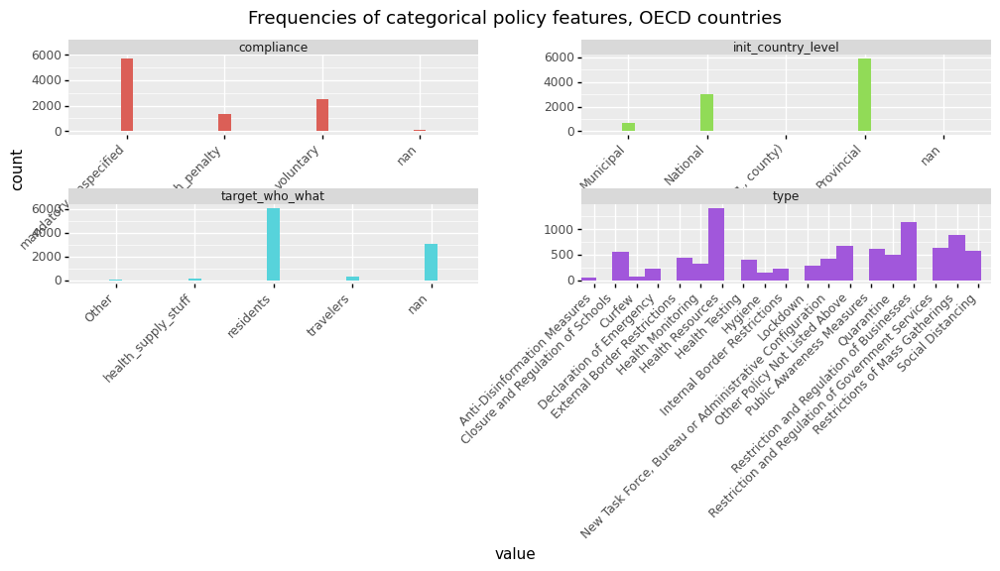

<ggplot: (621512566)>

In [730]:
p8

In [ ]:
ggsave(plot=p8, filename='cat.png', dpi=200, limitsize=True)

In [15]:
oecd_clean.type.value_counts(normalize=True)

Health Resources                                          0.147028
Restriction and Regulation of Businesses                  0.119072
Restrictions of Mass Gatherings                           0.091634
Other Policy Not Listed Above                             0.069994
Restriction and Regulation of Government Services         0.064920
Public Awareness Measures                                 0.064506
Social Distancing                                         0.060261
Closure and Regulation of Schools                         0.056948
Quarantine                                                0.052185
External Border Restrictions                              0.045972
New Task Force, Bureau or Administrative Configuration    0.043487
Health Testing                                            0.040899
Health Monitoring                                         0.034479
Lockdown                                                  0.030545
Declaration of Emergency                                  0.02

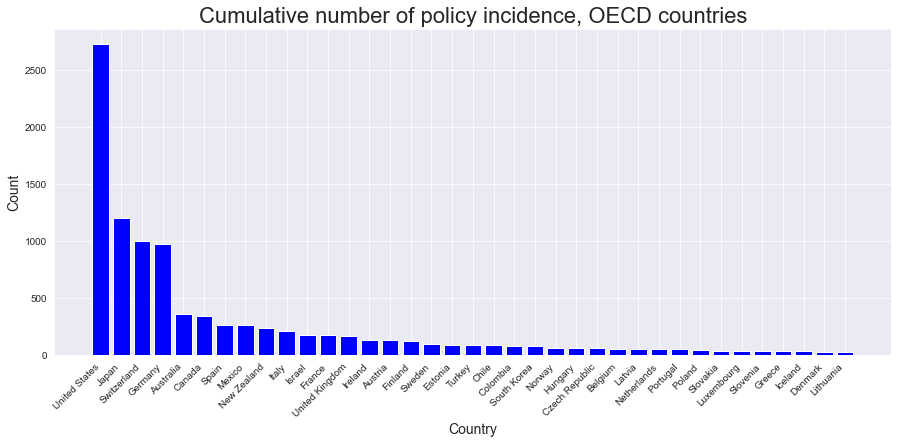

In [677]:
d0 = oecd_clean.filter(items=['country'])

temp = pd.DataFrame(d0.country.value_counts().reset_index())
temp.columns = ['country', 'count']

fig= plt.figure(figsize=(15,6))
p1 = plt.bar( temp["country"], temp["count"], color='b')
# The following commands add labels to our figure.
plt.xlabel('Country', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, horizontalalignment="right")
plt.title('Cumulative number of policy incidence, OECD countries', fontsize=22)

plt.grid(True)
plt.savefig('countrydistribute.png', dpi=200, bbox_inches='tight')


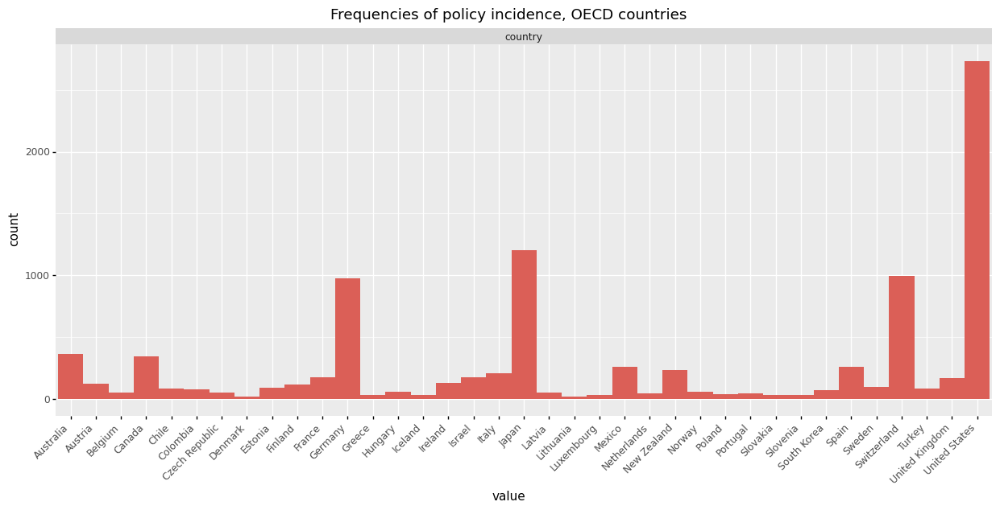

<ggplot: (623611959)>

In [657]:
d0 = oecd_clean.filter(items=['country','data_start'])
d0 = d0.select_dtypes(include = ['object']).melt()
(
    ggplot(d0,aes(x="value", fill='variable')) +
    geom_histogram(bins=37) +
    facet_wrap("variable",scales='free') +
    ggtitle("Frequencies of policy incidence, OECD countries")+
    theme(figure_size=(15,6),
          legend_position = "none",
          subplots_adjust={'wspace':0.25, 'hspace': 0.7},
         axis_text_x=element_text(rotation=45, hjust=1))
)

In [17]:
policy_occur = oecd_clean.filter(items=['type','date_start'])
policy_occur = policy_occur.set_index(['date_start']).sort_index().reset_index()
# count Cumulative incidence of policy event types over time.
policy_occur["cumcount"]= policy_occur.groupby(['type']).cumcount()
policy_occur = policy_occur.drop(policy_occur.tail(2).index)
policy_occur.head(3)

,date_start,type,cumcount
0,2019-12-31,"New Task Force, Bureau or Administrative Confi...",0
1,2020-01-03,Health Testing,0
2,2020-01-08,Social Distancing,0


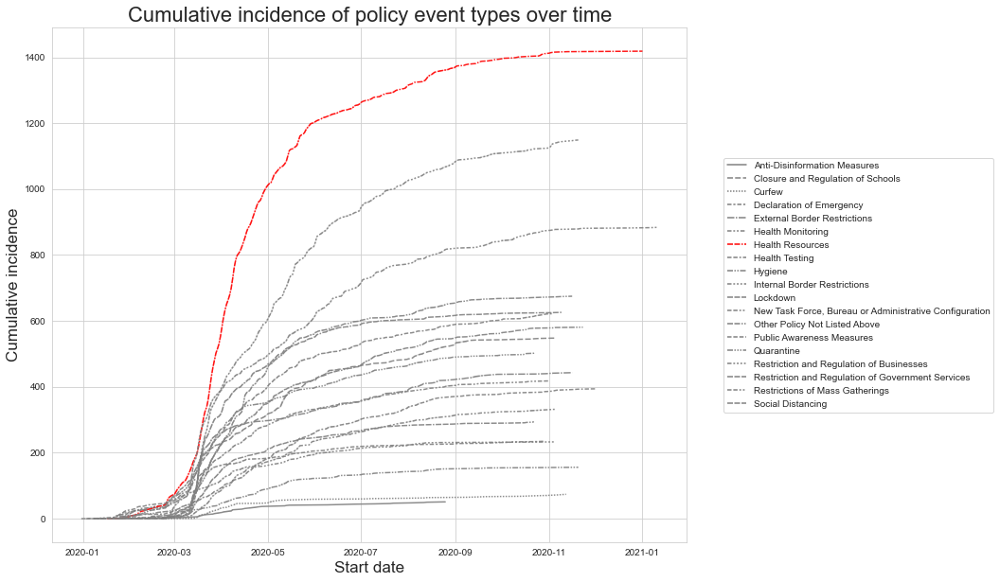

In [545]:
# plot government policy activity index
plt.figure(figsize=(12,10))
sns.set_style("whitegrid")

palette = {c:'red' if c=='Health Resources' else 'grey' for c in policy_occur.type.unique()}

ax0 = sns.lineplot(data=policy_occur, x='date_start', y='cumcount', hue='type',style="type",alpha=0.9,palette=palette)

ax0.set_title("Cumulative incidence of policy event types over time",fontsize=22)
ax0.set_xlabel("Start date",fontsize=17)
ax0.set_ylabel("Cumulative incidence",fontsize=17)
ax0.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=1)
            

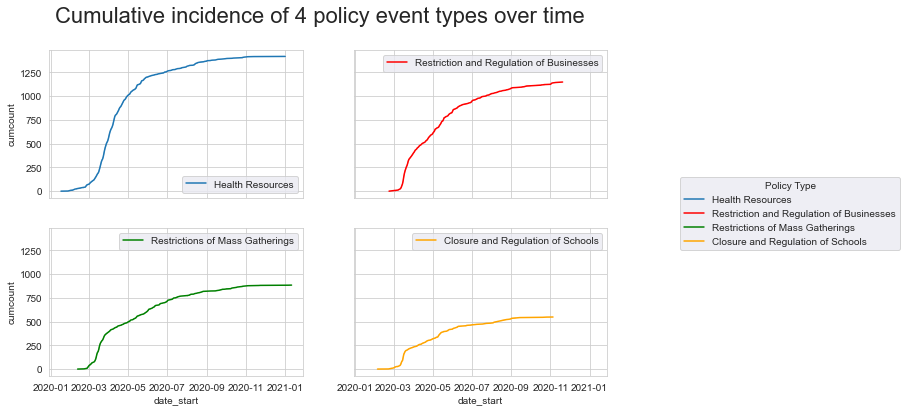

In [640]:
fig,axes =  plt.subplots(2, 2, figsize=(10, 6), sharex=True, sharey=True)
sns.set_style("darkgrid")
fig.suptitle('Cumulative incidence of 4 policy event types over time',fontsize=22)


l1=sns.lineplot(data=policy_occur[policy_occur.type=='Health Resources'], 
                x='date_start', y='cumcount',ax=axes[0,0],label="Health Resources")
l2=sns.lineplot(data=policy_occur[policy_occur.type=='Restriction and Regulation of Businesses'],  
                x='date_start', y='cumcount',color="red",ax=axes[0,1],label='Restriction and Regulation of Businesses')
l3=sns.lineplot(data=policy_occur[policy_occur.type=='Restrictions of Mass Gatherings'], 
                x='date_start', y='cumcount', color="green", ax=axes[1,0],label='Restrictions of Mass Gatherings')
l4=sns.lineplot(data=policy_occur[policy_occur.type=='Closure and Regulation of Schools'],  
                x='date_start', y='cumcount', color="orange", ax=axes[1,1],label='Closure and Regulation of Schools')

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]

# Create the legend
fig.legend(lines,     # The line objects   
           labels,
           loc="center left",bbox_to_anchor=(1, 0.5),   # Position of legend
           borderaxespad=0.1,    # Small spacing around legend box
           title="Policy Type"  # Title for the legend
           )
plt.savefig('temporaldistribute.png', dpi=200, bbox_inches='tight')

53


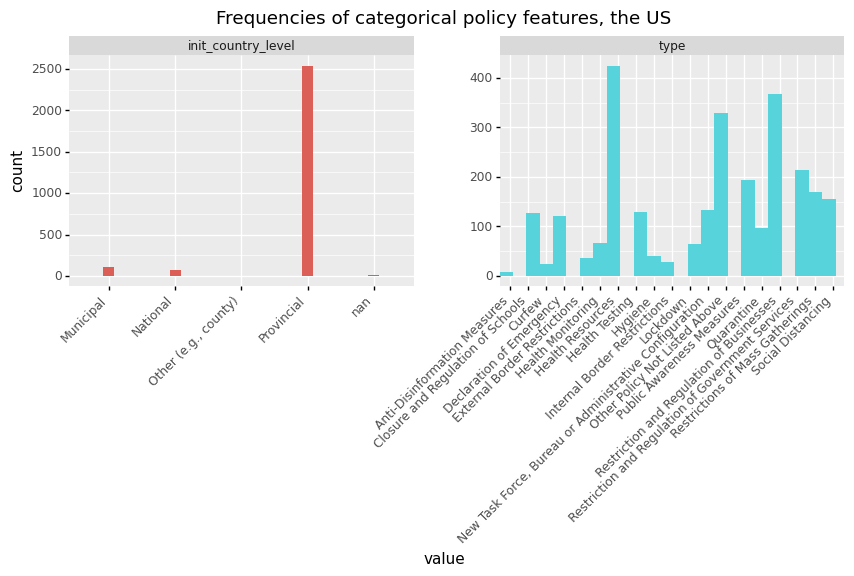

<ggplot: (619887114)>

In [624]:
# US data
dat_us = dat_oecd_final[dat_oecd_final['country'] == "United States"]
# the dataset include policies issued in every states
print(len(dat_us.province.unique()))
dat_us = oecd_clean[oecd_clean['country'] == "United States"]
# plot proportion of policies
d2 = dat_us.filter(items=['init_country_level','type'])
d2 = d2.select_dtypes(include = ['category']).melt()
(
    ggplot(d2,aes(x="value", fill='variable')) +
    geom_histogram(bins=25) +
    facet_wrap("variable",scales='free') +
    ggtitle("Frequencies of categorical policy features, the US")+
    theme(figure_size=(10,3),
          legend_position = "none",
          subplots_adjust={'wspace':0.25, 'hspace': 0.7},
         axis_text_x=element_text(rotation=45, hjust=1))
)

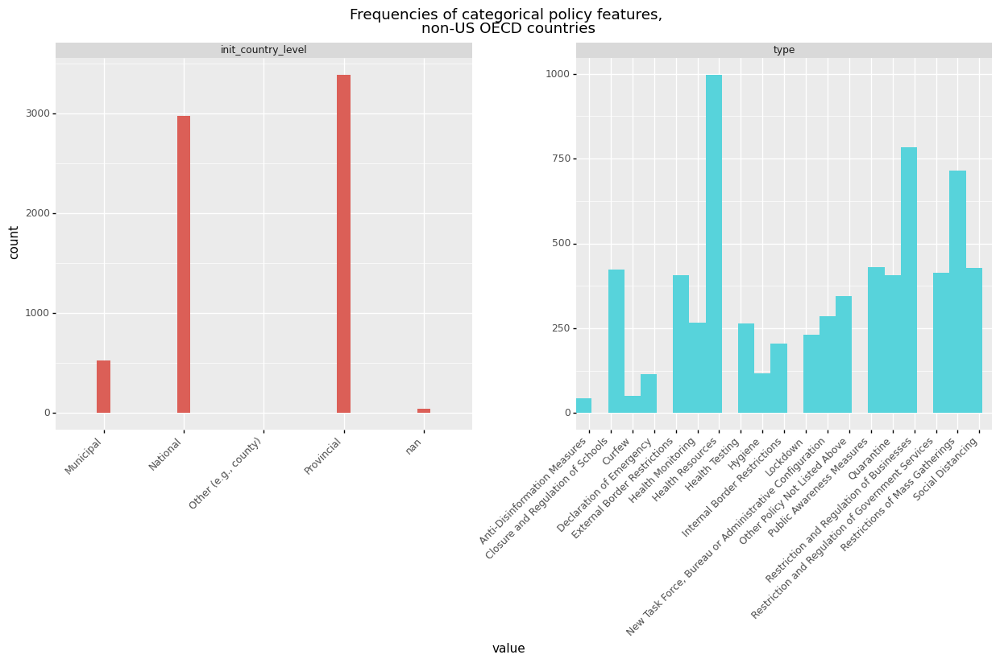

<ggplot: (306608014)>

In [22]:
# non-US oecd data
not_us = oecd_clean[oecd_clean['country'] != "United States"]

# plot proportion of policies
d3 = not_us.filter(items=['init_country_level','type'])
d3 = d3.select_dtypes(include = ['category']).melt()
(
    ggplot(d3,aes(x="value", fill='variable')) +
    geom_histogram(bins=25) +
    facet_wrap("variable",scales='free') +
    ggtitle("Frequencies of categorical policy features, \nnon-US OECD countries")+
    theme(figure_size=(15,6),
          legend_position = "none",
          subplots_adjust={'wspace':0.25, 'hspace': 0.7},
         axis_text_x=element_text(rotation=45, hjust=1))
)

#### Explore and clean numerical variables

In [637]:
# plot the distribution of numeric vars
num = oecd_pol_case.filter(items=['domestic_policy','pol_start_weekofyear','pol_duration'])
d4 = num.melt()
p7=(
    ggplot(d4,aes(x="value", fill='variable')) +
    geom_histogram(bins=25) +
    facet_wrap("variable",scales='free') +
    ggtitle("Frequencies of numeric policy features, OECD")+
    theme(figure_size=(12,2),
          legend_position = "none",
          subplots_adjust={'wspace':0.25, 'hspace': 0.4})
)
ggsave(plot=p7, filename='num.png', dpi=200, limitsize=True)

Text(2020-04-16, 49, 'United States')

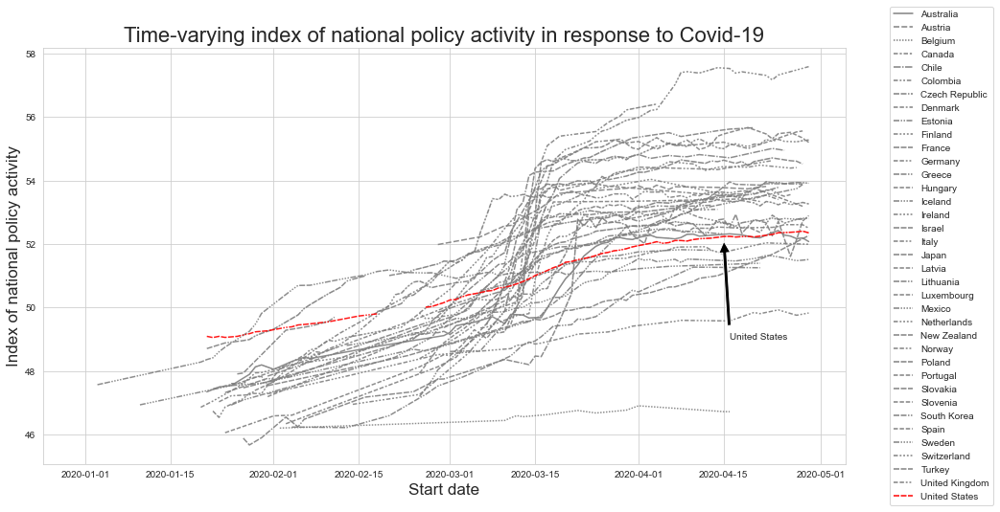

In [547]:

# plot government policy activity index
plt.figure(figsize=(15,8))
sns.set_style("whitegrid")

palette = {c:'red' if c=='United States' else 'grey' for c in oecd_clean.country.unique()}

ax = sns.lineplot(data=oecd_clean, x='date_start', y='index_med_est', 
                  hue='country',style="country",palette=palette,alpha=0.9)

ax.legend(loc='center left', bbox_to_anchor=(1.05, 0.5), ncol=1)
            
ax.set_title("Time-varying index of national policy activity in response to Covid-19",fontsize=22)
ax.set_xlabel("Start date",fontsize=17)
ax.set_ylabel("Index of national policy activity",fontsize=17)
ax.annotate('United States', xy=("2020-04-15", 52.239344), xytext=("2020-04-16", 49),
            arrowprops=dict(facecolor='black', shrink=0.05))


### Import Quarterly Economic data for OECD countries: quarterly GDP and unemployment

In [20]:
# read in the Quarterly National econ data
gdp_percap = pd.read_csv("../Data/GDPpercapita.csv", encoding = "ISO-8859-1")
# drop unuseful columns
gdp_percap = gdp_percap.filter(items=['Country', 'Measure', 'Value', 'Period']).rename(columns={"Value": "GDP_per_capita"})
# split quarter and year
gdp_percap[['quarter','year']] = gdp_percap.Period.str.split("-",expand=True,)

# find different types of GDP per capita measurements
print(gdp_percap.Measure.unique())

# split the two measurements into two dataframe
gdp_percap = gdp_percap[gdp_percap.Measure == 'Per Head, US $, current prices, current PPPs, seasonally adjusted']

gdp_percap = gdp_percap.drop(['Period','Measure'], axis=1).reset_index(drop=True)
# standardize country names
gdp_percap["Country"] = coco.convert(names=[x for x in gdp_percap["Country"]], to='name_short')
# check out first 5 rows of the data
gdp_percap.head(5) 

['Per Head, US $, current prices, current PPPs, seasonally adjusted'
 'Per Head, US dollars, volume estimates, fixed PPPs, OECD reference year, seasonally adjusted']


,Country,GDP_per_capita,quarter,year
0,Australia,50719.7,Q4,2017
1,Australia,51371.0,Q1,2018
2,Australia,52211.9,Q2,2018
3,Australia,52561.7,Q3,2018
4,Australia,53023.0,Q4,2018


In [21]:
# Quarterly Growth Rates of real GDP, change over same quarter, previous year
gdp_change = pd.read_csv("../Data/QGDP_change_year_quarter.csv", encoding = "ISO-8859-1")
# drop unuseful columns
gdp_change = gdp_change.filter(items=['Country','Subject','Measure','Value','TIME'])
# choose to see only the GDP
gdp_change = gdp_change[gdp_change.Subject == 'Gross domestic product - expenditure approach']
# split year-quarter data
gdp_change[['year','quarter']] = gdp_change.TIME.str.split("-",expand=True,)
gdp_change = gdp_change.drop(['TIME','Subject'], axis=1).reset_index(drop=True)

# standardize country names
gdp_change["Country"] = coco.convert(names=[x for x in gdp_change["Country"]], to='name_short')

In [22]:
# find different types of GDP measurements
print(gdp_change.Measure.unique())

# split the two measurements into two dataframe
gdp_change_year = gdp_change[gdp_change.Measure == 'Growth rate compared to previous quarter, seasonally adjusted']
QQcompare = ['Growth rate compared to the same quarter of previous year, seasonally adjusted',
             'Contributions to Q-o-Q GDP growth, seasonally adjusted']
gdp_change_quarter = gdp_change[gdp_change['Measure'].isin(QQcompare)]

# change column name into the specific measure
gdp_change_year = (gdp_change_year.rename(columns={"Value": "GDP_growth_rate_change_year"})
                    .drop(['Measure'], axis=1)
                   .reset_index(drop=True))

# similarly
gdp_change_quarter = (gdp_change_quarter.rename(columns={"Value": "GDP_growth_rate_change_quart"})
                        .drop(['Measure'], axis=1)
                        .reset_index(drop=True))
# left merge
gdp_change_quartyear = pd.merge(gdp_change_quarter,gdp_change_year, how='left', on=['Country','year','quarter'])
gdp_change_quartyear.sample(3)

['Growth rate compared to previous quarter, seasonally adjusted'
 'Growth rate compared to the same quarter of previous year, seasonally adjusted']


,Country,GDP_growth_rate_change_quart,year,quarter,GDP_growth_rate_change_year
170,New Zealand,2.319037,2019,Q3,0.720095
45,Denmark,3.029676,2018,Q4,0.786991
40,Czech Republic,1.968244,2019,Q4,0.432102


In [23]:
# read in the quarterly unemployment data
unemployment = pd.read_csv("../Data/quarterly_unemployment_rates.csv", encoding = "ISO-8859-1")
# drop unuseful columns
unemployment = unemployment.filter(items=['Country','Subject','Time','Value']).rename(columns={"Value": "unemployment_rate"})

# standardize country names
unemployment["Country"] = coco.convert(names=[x for x in unemployment["Country"]], to='name_short')
# there are three types of measure: male, female and all persons, we all care about all persons
unemployment = unemployment[unemployment.Subject == 'Unemployment rate (monthly), Total, All persons']
# some countries have monthly unemployment rate but all countries have quarterly data, we filter only quarterly data 
unemployment = unemployment[unemployment.Time.str[0] == 'Q']
unemployment[['quarter','year']] = unemployment.Time.str.split("-",expand=True,)
# drop Subject since we know what kind of measue of unempployment it is
unemployment = unemployment.drop(['Time','Subject'], axis =1).reset_index(drop=True)

unemployment.sample(3)

,Country,unemployment_rate,quarter,year
24,Canada,5.700000,Q4,2019
49,France,8.666667,Q1,2019
155,Portugal,6.466667,Q1,2020


In [24]:
# merge GDP percap, GDP growth rate change, unemployment dta 
quart_dat = pd.merge(unemployment, gdp_change_quartyear,how='left', on=['Country','year','quarter'])
quart_dat = pd.merge(quart_dat, gdp_percap,how='left', on=['Country','year','quarter'])
quart_dat

,Country,unemployment_rate,quarter,year,GDP_growth_rate_change_quart,GDP_growth_rate_change_year,GDP_per_capita
0,Australia,5.025599,Q1,2019,1.699904,0.443936,53553.3
1,Australia,5.229816,Q2,2019,1.557471,0.758093,54425.3
2,Australia,5.231740,Q3,2019,1.824480,0.505938,54884.4
3,Australia,5.164824,Q4,2019,2.279479,0.552559,55265.8
4,Australia,5.190445,Q1,2020,1.560467,-0.262173,55165.8
...,...,...,...,...,...,...,...
248,Colombia,10.768950,Q3,2019,3.449547,0.839128,NaN
249,Colombia,10.655470,Q4,2019,3.367256,0.658645,NaN
250,Colombia,11.217770,Q1,2020,1.033436,-1.380323,NaN
251,Colombia,20.665990,Q2,2020,-16.019190,-16.104954,NaN


In [25]:
# read in the oecd country population data -- unit: million
pop = pd.read_csv("../Data/pop.csv", encoding = "ISO-8859-1")
# drop unuseful columns
pop = (pop.rename(columns={pop.columns[0]:"country", "Value":"population"})
    .drop(['MEASURE', 'INDICATOR','FREQUENCY','SUBJECT','Flag Codes'], axis=1))
# keep only the newest data
pop= pop[pop.TIME == 2018].reset_index().drop(["index"], axis=1)
# standardize country names
pop["country"] = coco.convert(names=[x for x in pop["country"]], to='name_short')
pop.head(3)

,country,TIME,population
0,Australia,2018,24.992860
1,Austria,2018,8.837707
2,Belgium,2018,11.403740


### Import Covid-19 global time series data (as of Nov 30 2020)
#### Covid cases data

In [26]:
# read in the Covid global caseload data
covid_cases = pd.read_csv("../Data/time_series_covid19_confirmed_global.csv", encoding = "ISO-8859-1")

# drop unuseful columns
covid_cases=covid_cases.drop(['Lat','Long'], axis=1).reset_index(drop=True).rename(columns={"Country/Region": "country"})
# standardize country names
covid_cases["country"] = coco.convert(names=[x for x in covid_cases["country"]], to='name_short')
# OECD country data -- except for the US
covid_cases = covid_cases[covid_cases['country'].isin(oecd)]

# Dependencies of countries like the UK are listed under the province/state level -- which we don't care about, drop
# but Canada and Australia are only recorded on provincial level -- don't drop for them
oecd_nous_cases = (covid_cases[covid_cases["Province/State"].isnull()].drop(["Province/State"],axis=1)
                    .set_index("country").transpose().reset_index().rename_axis(None,axis=1))

# transpose df for Can and Aus
can_cases = (covid_cases[covid_cases["country"]=="Canada"]
            .drop(["Province/State"],axis=1).transpose())
aus_cases = (covid_cases[covid_cases["country"]=="Australia"]
            .drop(["Province/State"],axis=1).transpose())
# add up province cases to calculate total national cases in Aus and Can 
can_cases['Canada'] = can_cases.sum(axis=1)
aus_cases['Australia'] = aus_cases.sum(axis=1)
# only keep the total cases columns
can_cases = can_cases.iloc[1:].reset_index().filter(items=["index","Canada"])  
aus_cases = aus_cases.iloc[1:].reset_index().filter(items=["index","Australia"])  

# merge other oecd countries with can and aus
oecd_nous_cases = pd.merge(oecd_nous_cases, aus_cases, how ="left", on=["index"])
oecd_cases = pd.merge(oecd_nous_cases, can_cases, how ="left", on=["index"])

Diamond Princess not found in regex
MS Zaandam not found in regex


In [27]:
daily_new_cases= oecd_cases.set_index('index').diff().fillna(0)
daily_new_cases

,Austria,Belgium,Chile,Colombia,Czech Republic,Denmark,Estonia,Finland,France,Germany,...,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,United States,United Kingdom,Australia,Canada
index,,,,,,,,,,,,,,,,,,,,,
1/22/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1/23/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1/24/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0
1/25/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0
1/26/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11/26/20,5526.0,2565.0,1570.0,9496.0,6305.0,1191.0,414.0,496.0,13541.0,21951.0,...,1953.0,1767.0,12289.0,5841.0,4509.0,36008.0,110611.0,17555.0,8,5679
11/27/20,4954.0,3297.0,1581.0,10023.0,4464.0,1323.0,368.0,618.0,12335.0,20819.0,...,1849.0,1601.0,10853.0,6774.0,4312.0,44506.0,205557.0,14739.0,13,5954
11/28/20,4669.0,3619.0,1698.0,9103.0,2665.0,1636.0,375.0,541.0,12559.0,13845.0,...,1526.0,1583.0,0.0,0.0,0.0,30103.0,155596.0,15871.0,6,5675


#### Covid death data

In [29]:
# read in the Covid global deaths data
covid_death = pd.read_csv("../Data/time_series_covid19_deaths_global.csv", encoding = "ISO-8859-1")

# drop unuseful columns
covid_death=covid_death.drop(['Lat','Long'], axis=1).reset_index(drop=True).rename(columns={"Country/Region": "country"})
# standardize country names
covid_death["country"] = coco.convert(names=[x for x in covid_death["country"]], to='name_short')
# OECD country data -- except for the US
covid_death = covid_death[covid_death['country'].isin(oecd)]

# Dependencies of countries like the UK are listed under the province/state level -- which we don't care about, drop
# but Canada and Australia are only recorded on provincial level -- don't drop for them
oecd_death = (covid_death[covid_death["Province/State"].isnull()].drop(["Province/State"],axis=1)
                    .set_index("country").transpose().reset_index().rename_axis(None,axis=1))

# transpose df for Can and Aus
can_d = (covid_death[covid_death["country"]=="Canada"]
            .drop(["Province/State"],axis=1).transpose())
aus_d = (covid_cases[covid_death["country"]=="Australia"]
            .drop(["Province/State"],axis=1).transpose())
# add up province cases to calculate total national cases in Aus and Can 
can_d['Canada'] = can_d.sum(axis=1)
aus_d['Australia'] = aus_d.sum(axis=1)
# only keep the total cases columns
can_d = can_d.iloc[1:].reset_index().filter(items=["index","Canada"])  
aus_d = aus_d.iloc[1:].reset_index().filter(items=["index","Australia"])  

# merge other oecd countries with can and aus
oecd_death = pd.merge(oecd_death, aus_d, how ="left", on=["index"])
oecd_death = pd.merge(oecd_death, can_d, how ="left", on=["index"])

# calculate the daily new death
daily_new_death= oecd_death.set_index('index').diff().fillna(0)
daily_new_death.tail(2)

Diamond Princess not found in regex
MS Zaandam not found in regex


,Austria,Belgium,Chile,Colombia,Czech Republic,Denmark,Estonia,Finland,France,Germany,...,Slovakia,Slovenia,Spain,Sweden,Switzerland,Turkey,United States,United Kingdom,Australia,Canada
index,,,,,,,,,,,,,,,,,,,,,
11/29/20,87.0,86.0,34.0,183.0,84.0,6.0,3.0,0.0,198.0,125.0,...,18.0,48.0,0.0,0.0,29.0,185.0,826.0,215.0,10,53
11/30/20,79.0,98.0,54.0,182.0,157.0,8.0,6.0,6.0,406.0,388.0,...,23.0,51.0,401.0,0.0,165.0,188.0,1172.0,203.0,10,101


### Scraping 2019 GHS index, and aggregated Covid-19 data as of Nov 30, 2020

In [30]:
url2="https://www.ghsindex.org/#l-section--map"
ghs = requests.get(url2)
# check connection to page
ghs.status_code
# downloaded the entire website and parse the content with beautifulsoup
ghs.content
soup = BeautifulSoup(ghs.content, 'html.parser')

__But the website has many deeply nested tables that beautifulsoup failed to scrape.__ 

In [31]:
# store and get the url that we'll scrape.
url="https://coronavirus.jhu.edu/data/mortality"
covid_mort = requests.get(url)
# check connection to page
covid_mort.status_code

200

In [32]:
# extract the country BIT table from the webpage 
table = pd.read_html(covid_mort.text)
# save the table (dtype: list) as a dataframe
covidedat = table[0]
# standardize country names
covidedat["Country"] = coco.convert(names=[x for x in covidedat["Country"]], to='name_short')
# rename column
covidedat = covidedat.rename(columns={covidedat.columns[-1]:"Deaths100kpop", "Case-Fatality": "case_fatality"})
# OECD country data
coviddat_oecd = covidedat[covidedat['Country'].isin(oecd)]
# calculate population/100K
coviddat_oecd["pop/100K"] = coviddat_oecd.apply(lambda row: row.Deaths/row.Deaths100kpop, axis=1)
coviddat_oecd.head()

,Country,Confirmed,Deaths,case_fatality,Deaths100kpop,pop/100K
0,Belgium,615058,18278,3.0%,160.02,114.223222
3,Italy,1888144,66537,3.5%,110.10,604.332425
4,Slovenia,100401,2190,2.2%,105.93,20.674030
7,Spain,1773290,48596,2.7%,104.01,467.224305
9,United Kingdom,1918736,65618,3.4%,98.69,664.890060


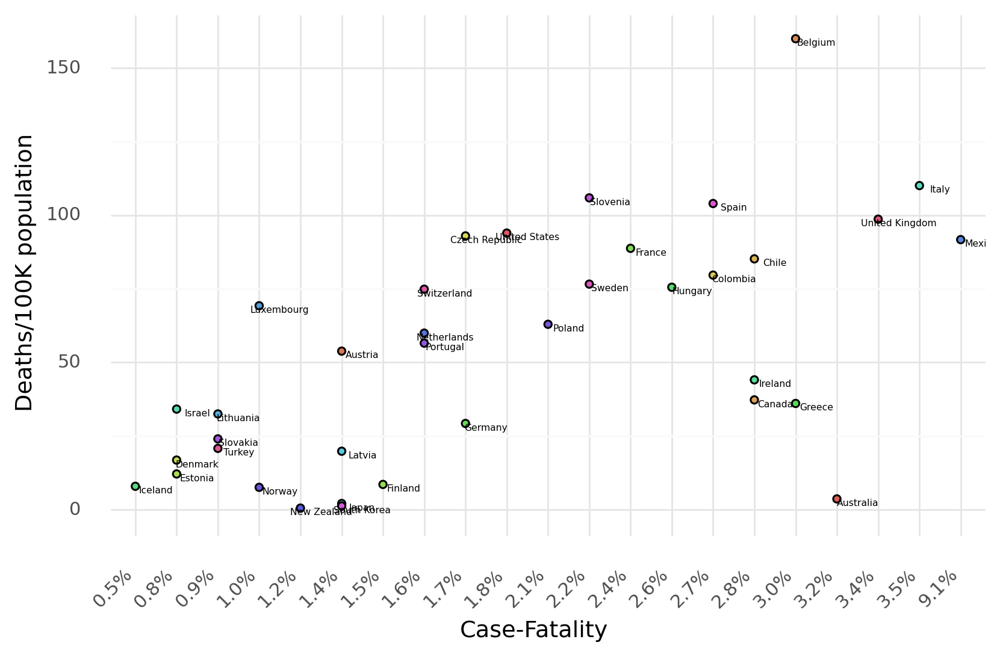

<ggplot: (298735198)>

In [33]:
(
    ggplot(coviddat_oecd,
          aes(x="case_fatality",y="Deaths100kpop", fill="Country")) +
    geom_point() +
    geom_text(aes(label='Country'), size=4.5, position = position_nudge(x=0.5, y =-1.5))+
    labs(x="Case-Fatality",y="Deaths/100K population") +
    theme_minimal() +
    theme(legend_position = "none",dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(rotation=45, hjust=1))
)


In [34]:
# plotting Deaths per 100k pop -- global
covidedat = covidedat.replace({"United States": "United States of America",
                               "Serbia": "Republic of Serbia", 
                               "DR Congo":"Democratic Republic of the Congo",
                              "Kyrgyz Republic":"Kyrgyzstan",
                              "Tanzania": "United Republic of Tanzania"})
m = folium.Map([10, -10], zoom_start= 2)

folium.Choropleth(
    geo_data = "../Data/custom.geo.json",
    data = covidedat,
    columns = ['Country','Deaths100kpop'],
    nan_fill_color = 'gray',
    nan_fill_opacity = 0.20,
    key_on='feature.properties.sovereignt',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='COVID-19 Deaths per 100k population | Data Source: John Hopkins University Coronavirus Resource Center',
).add_to(m)


m

In [35]:

# plotting Deaths per 100k pop -- oecd
temp = coviddat_oecd.replace({"United States": "United States of America",
                               "Serbia": "Republic of Serbia", 
                               "DR Congo":"Democratic Republic of the Congo",
                              "Kyrgyz Republic":"Kyrgyzstan",
                              "Tanzania": "United Republic of Tanzania"})
m = folium.Map([10, -10], zoom_start= 2)

folium.Choropleth(
    geo_data = "../Data/custom.geo.json",
    data = temp,
    columns = ['Country','Deaths100kpop'],
    nan_fill_color = 'gray',
    nan_fill_opacity = 0.20,
    key_on='feature.properties.sovereignt',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='COVID-19 Deaths per 100k population | Data Source: John Hopkins University Coronavirus Resource Center',
).add_to(m)
folium.LayerControl().add_to(m)
m


In [36]:
# read in the GHS index data
ghs = pd.read_csv("../Data/GHS.csv", encoding = "ISO-8859-1")
# drop unuseful columns
ghs = ghs.drop(['Rank','Unnamed: 4','Unnamed: 5','Unnamed: 6'], axis=1)
ghs = (ghs.rename(columns={ghs.columns[0]:"rank"})
            .drop(ghs.tail(4).index)) # drop last n rows
print(ghs.shape)

ghs['rank'] = ghs['rank'].map(lambda x: x.lstrip('=')).astype(int)
# check out all of the columns names and data types in the dataset
print(ghs.dtypes)

# standardize country names
ghs["Country"] = coco.convert(names=[x for x in ghs["Country"]], to='name_short')
# OECD country data
ghs_oecd = ghs[ghs['Country'].isin(oecd)]

# check out 5 random rows of the data
ghs_oecd.sample(5)

(195, 3)
rank             int64
Country         object
Score / 100    float64
dtype: object


SÃ£o TomÃ© and PrÃ­ncipe not found in regex


,rank,Country,Score / 100
35,35,New Zealand,54.0
2,3,Netherlands,75.6
8,9,South Korea,70.2
7,8,Denmark,70.4
51,52,Slovakia,47.9


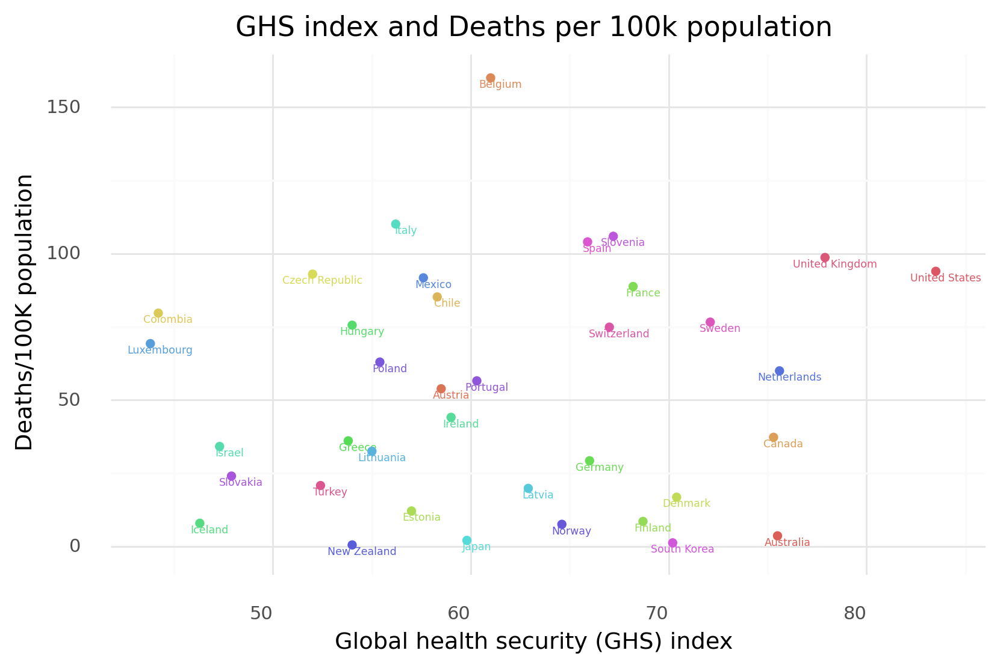

<ggplot: (298682986)>

In [37]:
temp_ghs=pd.merge(coviddat_oecd,ghs_oecd, how="left", on=["Country"])
temp_ghs
( 
    ggplot(temp_ghs,aes(x="Score / 100", y='Deaths100kpop', color="Country")) + 
    geom_text(aes(label='Country'), size=5, position = position_nudge(x=0.5, y =-2.2))+
    labs(x="Global health security (GHS) index",y="Deaths/100K population") +
    ggtitle("GHS index and Deaths per 100k population")+
    geom_point() + 
    theme_minimal() +
    theme(legend_position = "none", 
          dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1))
)

#### Economic decline in the second quarter of 2020 and deaths/100k population

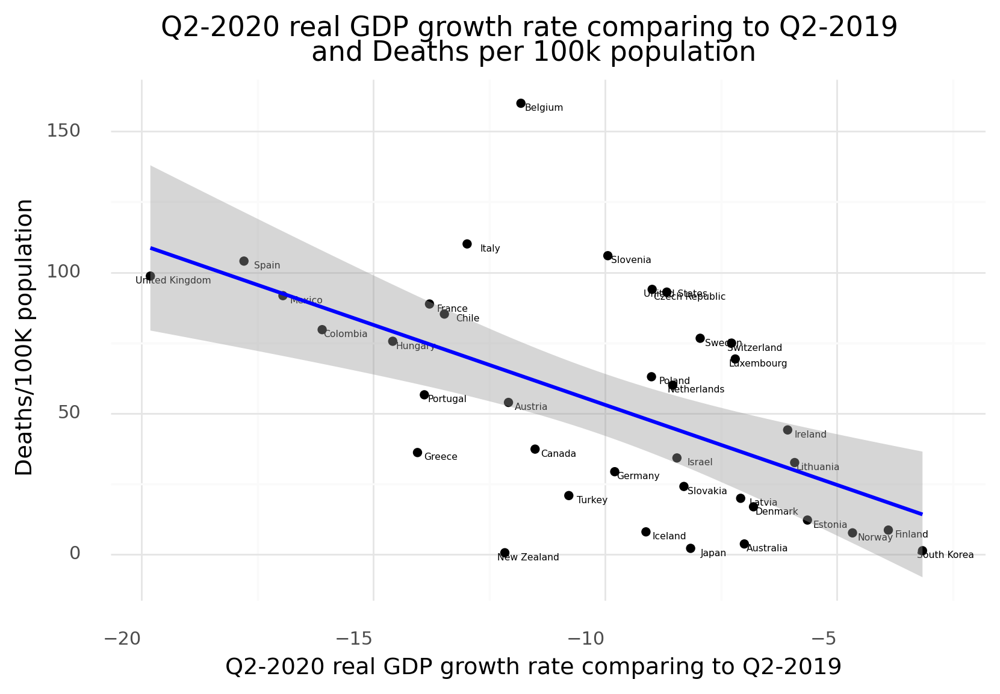

<ggplot: (504052044)>

In [271]:
econ_health = quart_dat[quart_dat["quarter"]=="Q2"]
econ_health = econ_health[econ_health["year"]=="2020"]
econ_health = econ_health.reset_index(drop=True) 
temp_death = coviddat_oecd.filter(items=["Country","Deaths100kpop"]).reset_index(drop=True)
econ_health = pd.merge(econ_health,temp_death, how='left', on=['Country'])


(
    ggplot(econ_health,
          aes(x="GDP_growth_rate_change_year",y="Deaths100kpop")) +
    geom_point() +
    geom_text(aes(label='Country'), size=4.5, position = position_nudge(x=0.5, y =-1.7))+
    geom_smooth(method='lm',color="blue") +
    labs(x="Q2-2020 real GDP growth rate comparing to Q2-2019",y="Deaths/100K population") +
    theme_minimal() +
    ggtitle("Q2-2020 real GDP growth rate comparing to Q2-2019 \nand Deaths per 100k population")+
    theme(dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1)) 

)


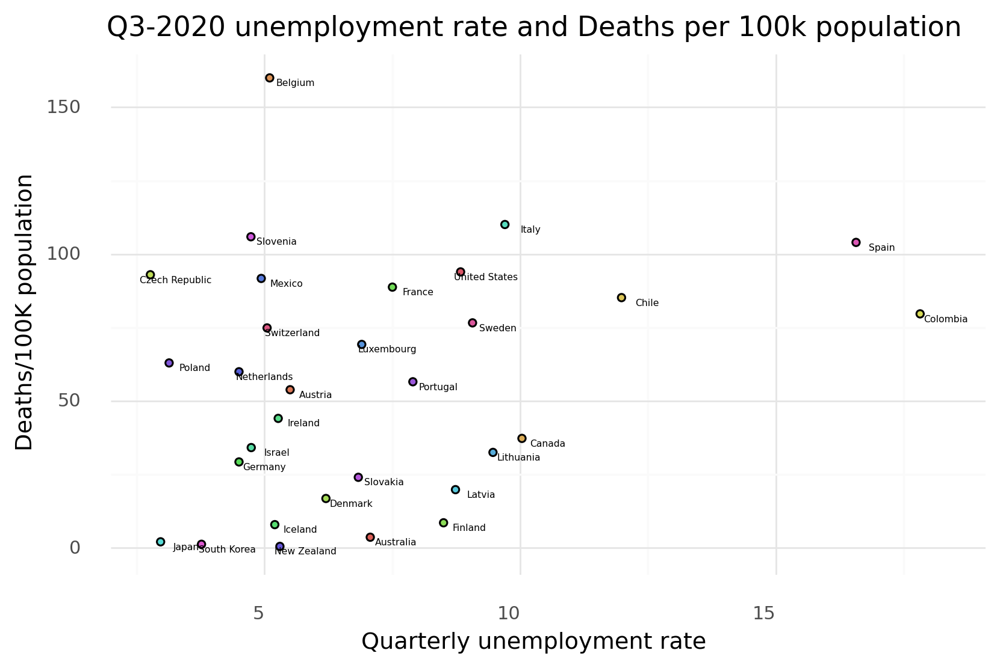

<ggplot: (501650923)>

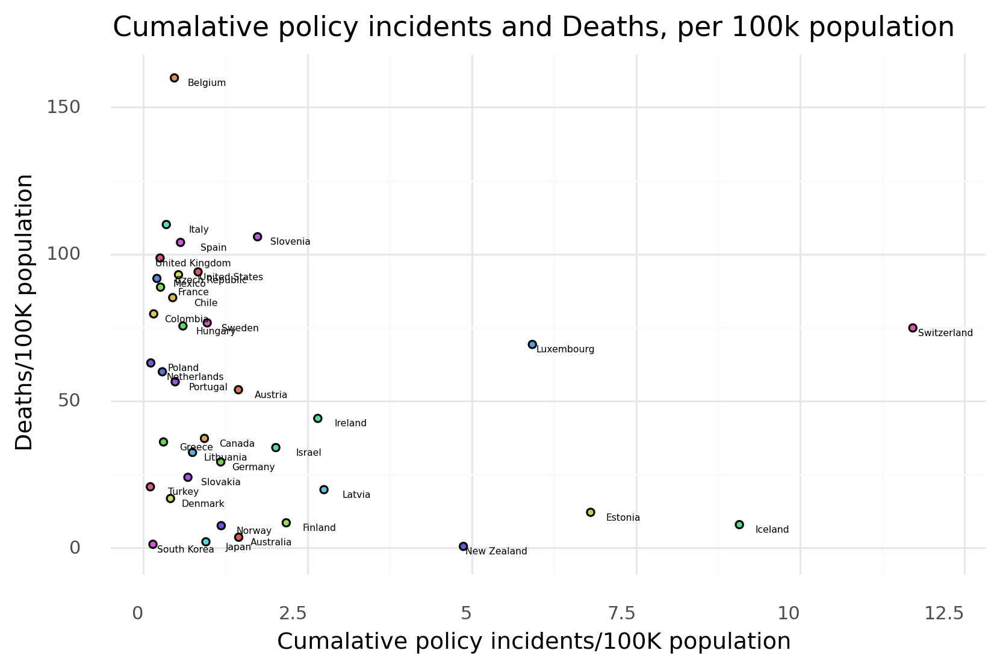

<ggplot: (300425888)>

In [40]:
pol_count = oecd_clean['country'].value_counts().to_frame().reset_index().rename(columns={'index':'country', 'country':'count'})
# merge cumulative count of policies with population of countries
pol_count = pd.merge(pol_count,pop, how='left', on=['country'])
# convert population to unit of 100k
pol_count["population"] = pol_count["population"]*10 
# calculate policy per 100k population for each country

pol_count["policy_per_100kpop"] = pol_count["count"]/pol_count["population"]
pol_count = pol_count.rename(columns={'country':'Country'})

# merge pol_count with covid cases
temp_polcount = pd.merge(pol_count, coviddat_oecd,how='left', on=['Country'])
(
    ggplot(temp_polcount,
          aes(x="policy_per_100kpop",y="Deaths100kpop",fill="Country")) +
    geom_point() +
    geom_text(aes(label='Country'), size=4.5, position = position_nudge(x=0.5, y =-1.7))+
    labs(x="Cumalative policy incidents/100K population",y="Deaths/100K population") +
    theme_minimal() +
    ggtitle("Cumalative policy incidents and Deaths, per 100k population")+
    theme(legend_position = "none", 
          dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1))
)                    

### Predictive Model for Covid-19 Cases and Deaths: Country-Day
#### 1, Keep tidying the data and combine data frames

Timestamp('2020-04-29 00:00:00')

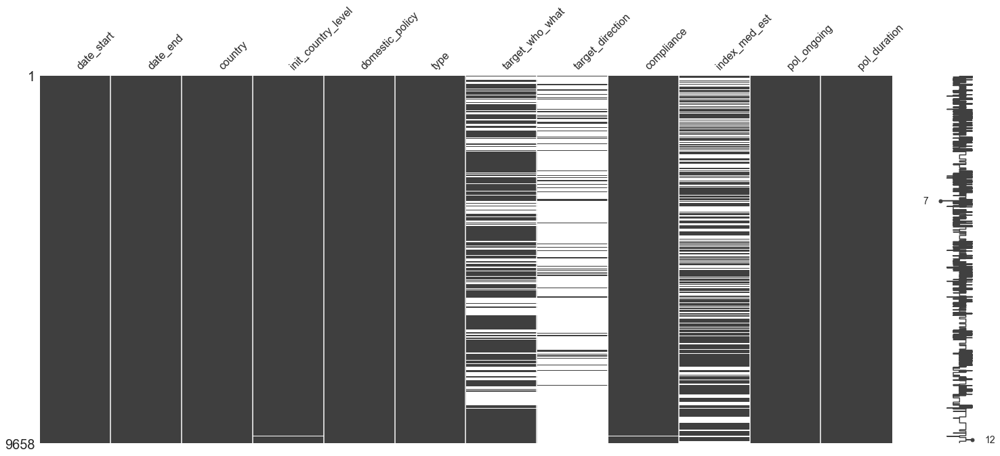

In [41]:
# inspect missingness in both numeric variables and objects
miss.matrix(oecd_clean)
# check the latest giv response index rating: 
temp3 = oecd_clean.filter(items=['date_start', 'country', 'index_med_est']).dropna()
temp3.date_start.max()

In [42]:
# drop the target_direction column due to large missingness
# drop index_med_est because data only available to April 29
oecd_clean1 = oecd_clean.drop(["target_direction","index_med_est"], axis=1).\
                set_index(['country','date_start']).sort_index().reset_index()
# assume the lagged effect of policy for covid cases is three weeks and the lagged effect for deaths is four weeks
oecd_clean1["lagged_case_date"]=oecd_clean1.apply(lambda row: row.date_start + timedelta(weeks=3), axis=1)
oecd_clean1["lagged_death_date"]=oecd_clean1.apply(lambda row: row.date_start + timedelta(weeks=4), axis=1)
# drop the last row because it is hapenning in 2024
oecd_clean1 = oecd_clean1.drop(oecd_clean1.tail(1).index)

In [43]:
# calculate one monthly average covid cases from each date on
monthly_av_case = daily_new_cases.copy()
for x in range(0,314):
    monthly_av_case.iloc[x] = monthly_av_case[x: x +30].mean().round(4)

# melt the dataframe to make merging convenient 
monthly_av_case = monthly_av_case.reset_index().melt(id_vars = ['index'])\
                    .rename(columns={'variable':"country", "value":"30d_av_case"})

# normalize by 100K population
# merge cases with population of countries
monthly_av_case = pd.merge(monthly_av_case,pop, how='left', on=['country'])
# convert population to unit of 100k (right now it's unit is million)
monthly_av_case["population"] = monthly_av_case["population"]*10 
# calculate cases per 100k population for each country

monthly_av_case["30d_av_case_per_100kpop"] = monthly_av_case.apply(lambda row: row["30d_av_case"] / row.population, axis=1)
monthly_av_case.sample(5)

,index,country,30d_av_case,TIME,population,30d_av_case_per_100kpop
9486,3/28/20,Sweden,516.6667,2018,101.75214,5.077699
1490,9/12/20,Czech Republic,2775.0000,2018,106.26430,26.114132
728,5/1/20,Chile,3367.2667,2018,187.51405,17.957410
3959,7/31/20,Iceland,7.6000,2018,3.52722,2.154671
914,11/3/20,Chile,1378.6786,2018,187.51405,7.352402


In [44]:
# calculate one monthly average covid deaths from each date on
monthly_av_death = daily_new_death.copy()
for x in range(0,314):
    monthly_av_death.iloc[x] = monthly_av_death[x: x +30].mean().round(4)
    
# melt the dataframe to make merging convenient 
monthly_av_death = monthly_av_death.reset_index().melt(id_vars = ['index'])\
                    .rename(columns={'variable':"country", "value":"30d_av_death"})

# normalize by 100K population
# merge death with population of countries
monthly_av_death = pd.merge(monthly_av_death,pop, how='left', on=['country'])
# convert population to unit of 100k (right now it's unit is million)
monthly_av_death["population"] = monthly_av_death["population"]*10 
# calculate cases per 100k population for each country

monthly_av_death["30d_av_death_per_100kpop"] = monthly_av_death.apply(lambda row: row["30d_av_death"] / row.population, axis=1)
monthly_av_death.sample(5)

,index,country,30d_av_death,TIME,population,30d_av_death_per_100kpop
1336,4/11/20,Czech Republic,5.3667,2018,106.26430,0.050503
3022,8/5/20,Germany,5.3000,2018,829.14191,0.006392
1720,6/20/20,Denmark,0.3667,2018,57.89957,0.006333
9177,4/2/20,Spain,505.2000,2018,467.33038,1.081034
9466,3/8/20,Sweden,28.8000,2018,101.75214,0.283041


In [45]:
# merge the case data onto oecd_clean1
monthly_av_case1 = monthly_av_case.rename(columns={'index':"lagged_case_date"})\
                    .drop(["TIME", "population", "30d_av_case"], axis=1)
monthly_av_case1["lagged_case_date"] = pd.to_datetime(monthly_av_case1["lagged_case_date"], format='%m/%d/%y')

oecd_pol_case = pd.merge(oecd_clean1,monthly_av_case1, how='left', on=['country','lagged_case_date'])
oecd_pol_case = oecd_pol_case.drop(["lagged_case_date", "lagged_death_date"], axis=1)\
                    .dropna(subset=['30d_av_case_per_100kpop'])

In [46]:
# merge the case data onto oecd_clean1
monthly_av_death1 = monthly_av_death.rename(columns={'index':"lagged_death_date"})\
                    .drop(["TIME", "population", "30d_av_death"], axis=1)
monthly_av_death1["lagged_death_date"] = pd.to_datetime(monthly_av_death1["lagged_death_date"], format='%m/%d/%y')

oecd_pol_death = pd.merge(oecd_clean1,monthly_av_death1, how='left', on=['country','lagged_death_date'])
oecd_pol_death = oecd_pol_death.drop(["lagged_case_date", "lagged_death_date"], axis=1)\
                    .dropna(subset=['30d_av_death_per_100kpop'])


#### 2, Preprocessing
- Convert all categorical variables in the data to numeric values (dummies).
- Convert date_start into ordinal variables.
#### `compliance` and `init_country_level`

In [48]:
# set dummy for categoris in compliance var
oecd_pol_case['voluntary_comply'] = 1*(oecd_pol_case['compliance'] == "voluntary")
# Everything else ("mandatory_with_penalty", "mandatory_unspecified") is the baseline. 
# Drop compliance
oecd_pol_case = oecd_pol_case.drop(columns=["compliance"])

# set dummy for national-subnational policy var
oecd_pol_case['national_pol'] = 1*(oecd_pol_case['init_country_level'] == "National")
# Everyone else ("municipal", "provincial", "other(county)", NaN) is the baseline. 
# Drop init_country_level
oecd_pol_case = oecd_pol_case.drop(columns=["init_country_level"])


# set dummy for categoris in compliance var
oecd_pol_death['voluntary_comply'] = 1*(oecd_pol_death['compliance'] == "voluntary")
# Everything else ("mandatory_with_penalty", "mandatory_unspecified") is the baseline. 
# Drop compliance
oecd_pol_death = oecd_pol_death.drop(columns=["compliance"])

# set dummy for national-subnational policy var
oecd_pol_death['national_pol'] = 1*(oecd_pol_death['init_country_level'] == "National")
# Everyone else ("municipal", "provincial", "other(county)", NaN) is the baseline. 
# Drop init_country_level
oecd_pol_death = oecd_pol_death.drop(columns=["init_country_level"])

#### `type`
Collapse the policy type categories. For some of the categories, there is little representation in the data. By collapsing, we increase these bin sizes.

In [49]:
oecd_pol_case = oecd_pol_case.reset_index(drop=True)
oecd_pol_death = oecd_pol_death.reset_index(drop=True)

# combine categoris in type var:
list1=["Health Monitoring","Health Testing"]
oecd_pol_case['type']= np.where(oecd_pol_case['type'].isin(list1), 'health_testing_n_monitoring', oecd_pol_case['type'])

list2=["Public Awareness Measures","Anti-Disinformation Measures"]
oecd_pol_case['type']= np.where(oecd_pol_case['type'].isin(list2), 'public_awareness_anti_disinfo', oecd_pol_case['type'])

list3=["Quarantine","Lockdown","Curfew"]
oecd_pol_case['type']= np.where(oecd_pol_case['type'].isin(list3), 'quarantine_lockdown_curfew', oecd_pol_case['type'])

list4=["New Task Force, Bureau or Administrative Configuration", "Declaration of Emergency"]
oecd_pol_case['type']= np.where(oecd_pol_case['type'].isin(list4), 'new_taskforce_n_declare_emergency', oecd_pol_case['type'])

# convert to dummies
type_dummies0 = pd.get_dummies(oecd_pol_case.type)

# set "Other Policy Not Listed Above" as the Baseline
type_dummies0 = type_dummies0.drop(['Other Policy Not Listed Above'],axis=1)
type_dummies0.columns= type_dummies0.columns.str.replace(' ', '_')
# replace Marital column with mar_dummies 
oecd_pol_case = pd.concat([oecd_pol_case,type_dummies0],axis=1)
oecd_pol_case = oecd_pol_case.drop(['type'],axis=1)

################################
# combine categoris in type var:
list1=["Health Monitoring","Health Testing"]
oecd_pol_death['type']= np.where(oecd_pol_death['type'].isin(list1), 'health_testing_n_monitoring', oecd_pol_death['type'])

list2=["Public Awareness Measures","Anti-Disinformation Measures"]
oecd_pol_death['type']= np.where(oecd_pol_death['type'].isin(list2), 'public_awareness_anti_disinfo', oecd_pol_death['type'])

list3=["Quarantine","Lockdown","Curfew"]
oecd_pol_death['type']= np.where(oecd_pol_death['type'].isin(list3), 'quarantine_lockdown_curfew', oecd_pol_death['type'])

list4=["New Task Force, Bureau or Administrative Configuration", "Declaration of Emergency"]
oecd_pol_death['type']= np.where(oecd_pol_death['type'].isin(list4),\
                                 'new_taskforce_n_declare_emergency', oecd_pol_death['type'])

# convert to dummies
type_dummies1 = pd.get_dummies(oecd_pol_death.type)

# set "Other Policy Not Listed Above" as the Baseline
type_dummies1 = type_dummies1.drop(['Other Policy Not Listed Above'],axis=1)
type_dummies1.columns= type_dummies1.columns.str.replace(' ', '_')
# replace Marital column with mar_dummies 
oecd_pol_death = pd.concat([oecd_pol_death,type_dummies1],axis=1)
oecd_pol_death = oecd_pol_death.drop(['type'],axis=1)


#### `target_who_what`
Collapse the target_who_what categories. For some of the categories, there is little representation in the data. By collapsing, we increase these bin sizes.

In [50]:
oecd_pol_case['target_residents'] = 1*(oecd_pol_case["target_who_what"] == "residents")
oecd_pol_case['target_travelers'] = 1*(oecd_pol_case["target_who_what"] == "travelers")
# Everyone else ("other" and "health_supply_stuff") is the baseline. 
# Drop target_who_what
oecd_pol_case = oecd_pol_case.drop(columns=["target_who_what"])

###########################
oecd_pol_death['target_residents'] = 1*(oecd_pol_death["target_who_what"] == "residents")
oecd_pol_death['target_travelers'] = 1*(oecd_pol_death["target_who_what"] == "travelers")
# Everyone else ("other" and "health_supply_stuff") is the baseline. 
# Drop target_who_what
oecd_pol_death = oecd_pol_death.drop(columns=["target_who_what"])

#### save data at this point for later use (fixed effect models)

In [56]:
# before the next step: save case and death data as csv file
# oecd_pol_case.to_csv("../Data/case_fixed_effect.csv")
# oecd_pol_death.to_csv("../Data/death_fixed_effect.csv")

#### `date_start`
Convert the start date of policy to ordinal variables: month and week of the year

In [52]:
# converting datetimes to month and ordinal weeks
oecd_pol_case['pol_start_weekofyear'] = oecd_pol_case['date_start'].dt.week
oecd_pol_case=oecd_pol_case.drop(['date_start','date_end','pol_ongoing'],axis=1)

###########################
# same for death dataset
oecd_pol_death['pol_start_weekofyear'] = oecd_pol_death['date_start'].dt.week
oecd_pol_death=oecd_pol_death.drop(['date_start','date_end','pol_ongoing'],axis=1)


#### drop `country` variable
I'll put it back in fixed effect model

In [54]:
# drop country
oecd_pol_case=oecd_pol_case.drop(['country'],axis=1)

###########################
# same for death dataset
oecd_pol_death=oecd_pol_death.drop(['country'],axis=1)

#### 3, Build a machine learning Pipeline
- Pre-processes the data,
- Uses K-fold cross-validation with 5 folds. 
- Incorporates ML models:<br> 
linear model<br> 
Naive Bayes Classifier<br> 
K-nearest Neighbors Classifier (tune the model for different nearest neighbors configurations)<br> 
Decision Tree Classifier (tune the model for different tree depth sizes)<br> 
Random Forest Classifier (tune the model for different tree depth sizes, number of trees grown (i.e. “estimators”), and the number of variables selected when building each tree)

In [59]:
# import SKlearn packages
# For pre-processing data 
import sklearn
from sklearn import preprocessing as pp 
from sklearn.compose import ColumnTransformer 

# For splits and CV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold # Cross validation 
from sklearn.model_selection import cross_validate # Cross validation 
from sklearn.model_selection import GridSearchCV # Cross validation + param. tuning.

# Machine learning methods 
from sklearn.linear_model import LinearRegression as LM
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.tree import DecisionTreeRegressor as DTree
from sklearn import tree # For plotting the decision tree rules
from sklearn.ensemble import RandomForestRegressor as RF
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import BaggingRegressor as Bag

# For evaluating our model's performance
import sklearn.metrics as m

# Pipeline to combine modeling elements
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

# For fixed effect model
from linearmodels.panel import PanelOLS
from statsmodels.api import add_constant
from linearmodels import RandomEffects

In [60]:
# Set seed, so the split doesn't change as we rerun the code
# Train-Test split (just using Pandas)
y0 = oecd_pol_case[['30d_av_case_per_100kpop']]
X0 = oecd_pol_case.drop(columns=['30d_av_case_per_100kpop'])
train_X0, test_X0, train_y0, test_y0 = train_test_split(X0,y0,test_size = .25,random_state=123)

# print the train-test ratio
print(round(train_X0.shape[0]/oecd_pol_case.shape[0],2))
print(round(test_X0.shape[0]/oecd_pol_case.shape[0],2))

# Print off the split count for train and test data 
print("Training Data:",train_X0.shape[0],
      "\nTest Data:",test_X0.shape[0])

###########################

y1 = oecd_pol_death[['30d_av_death_per_100kpop']]
X1 = oecd_pol_death.drop(columns=['30d_av_death_per_100kpop'])
train_X1, test_X1, train_y1, test_y1 = train_test_split(X1,y1,test_size = .25,random_state=123)

# print the train-test ratio
print(round(train_X1.shape[0]/oecd_pol_death.shape[0],2))
print(round(test_X1.shape[0]/oecd_pol_death.shape[0],2))

# Print off the split count for train and test data 
print("Training Data:",train_X1.shape[0],
      "\nTest Data:",test_X1.shape[0])

# Look at the head of the case data
train_X0.head(3)


0.75
0.25
Training Data: 7224 
Test Data: 2408
0.75
0.25
Training Data: 7200 
Test Data: 2401


,domestic_policy,pol_duration,voluntary_comply,national_pol,Closure_and_Regulation_of_Schools,External_Border_Restrictions,Health_Resources,Hygiene,Internal_Border_Restrictions,Restriction_and_Regulation_of_Businesses,Restriction_and_Regulation_of_Government_Services,Restrictions_of_Mass_Gatherings,Social_Distancing,health_testing_n_monitoring,new_taskforce_n_declare_emergency,public_awareness_anti_disinfo,quarantine_lockdown_curfew,target_residents,target_travelers,pol_start_weekofyear
1898,0,236,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,15
9341,1,157,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,26
8338,0,63,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,15


In [61]:
# use K-fold cross-validation to estimate the test error
# Set the folds index to ensure comparable samples
fold_generator = KFold(n_splits=10, shuffle=True,random_state=1234)

#### Build a Pipeline

__First, let's build the model with all variables included.__

In [62]:
#  create our model pipe (note for the model we leave none as a placeholder)
pipe = Pipeline(steps=[('pre_process', pp.MinMaxScaler()),('model',None)])

# Specify the models and their repsective tuning parameters. 
# Note the naming convention here to reference the model key
search_space = [
   
    # Linear Model
    {'model' : [LM()]},
    
    # KNN with K tuning param
    {'model' : [KNN()],
     'model__n_neighbors':[30,40,50]},
    
    # Decision Tree with the Max Depth Param
    {'model': [DTree()],
     'model__max_depth':[2,3,4,5]},
    
    # The Bagging decision tree model 
    {'model': [Bag()],    
     'model__base_estimator':[DTree(),SVC(),RF()],
     'model__n_estimators':[10,20,25,30]
    },
    
    # Random forest with the N Estimators tuning param
    {'model' : [RF()],
    'model__max_depth':[2,3,4],
    'model__n_estimators':[500,750,1000],
    'model__max_features':[5,10,20]}
]

# Put it all together in the grid search
search0 = GridSearchCV(pipe, search_space, 
                      cv = fold_generator,
                      scoring='neg_mean_squared_error',
                      n_jobs=4)

# Fit the model to the training data
search0.fit(train_X0,train_y0)

GridSearchCV(cv=KFold(n_splits=6, random_state=1234, shuffle=True),
             estimator=Pipeline(steps=[('pre_process', MinMaxScaler()),
                                       ('model', None)]),
             n_jobs=4,
             param_grid=[{'model': [LinearRegression()]},
                         {'model': [KNeighborsRegressor()],
                          'model__n_neighbors': [30, 40, 50]},
                         {'model': [DecisionTreeRegressor()],
                          'model__max_depth': [2, 3, 4, 5]},
                         {'model': [BaggingRegressor(base_estimator=RandomForestRegressor(),
                                                     n_estimators=30)],
                          'model__base_estimator': [DecisionTreeRegressor(),
                                                    SVC(),
                                                    RandomForestRegressor()],
                          'model__n_estimators': [10, 20, 25, 30]},
                         {'m

In [67]:
#  look at the best fit score from the scan
print("The best fit score is " + str(search0.best_score_)) # Mean out-of-sample (CV) error

# look at the best model
print("The best model is " + str(search0.best_params_))

The best fit score is -34.01450873020394
The best model is {'model': BaggingRegressor(base_estimator=RandomForestRegressor(), n_estimators=30), 'model__base_estimator': RandomForestRegressor(), 'model__n_estimators': 30}


In [64]:
bag_mod = search0.best_estimator_
# Performance on training data
print("The MSE score on the Covid cases training data is " + str(m.mean_squared_error(train_y0,bag_mod.predict(train_X0))))
print("The R-squared score on the training data is " + str(m.r2_score(train_y0,bag_mod.predict(train_X0))))


The MSE score on the Covid cases training data is 13.443161888464452
The R-squared score on the training data is 0.786820280100669


In [566]:
# predict() method will use the best model out of the scan
pred_y0 = bag_mod.predict(test_X0)

# Performance on test data
print("The mean squared error on the test data is " + str(m.mean_squared_error(test_y0,pred_y0)))
print("The R-squared score on the test data is " + str(m.r2_score(test_y0,pred_y0)))


The mean squared error on the test data is 34.64002949563201
The R-squared score on the test data is 0.40518900808510316


In [706]:
# visualize the model accuracy
(
    ggplot(pd.DataFrame(dict(pred=pred_y0,truth=test_y0.values)),
          aes(x='pred',y="truth")) +
    geom_point(alpha=.75) +
    geom_abline(linetype="dashed",color="darkred",size=1) +
    theme_bw() +
    theme(figure_size=(10,7))
)

Exception: Data must be 1-dimensional

We see there is overfitting problem in the model.<br>
__Run the models for death dataset as well__

In [66]:
# Put it all together in the grid search
search1 = GridSearchCV(pipe, search_space, 
                      cv = fold_generator,
                      scoring='neg_mean_squared_error',
                      n_jobs=4)

# Fit the model to the training data -- death
search1.fit(train_X1,train_y1)

GridSearchCV(cv=KFold(n_splits=6, random_state=1234, shuffle=True),
             estimator=Pipeline(steps=[('pre_process', MinMaxScaler()),
                                       ('model', None)]),
             n_jobs=4,
             param_grid=[{'model': [LinearRegression()]},
                         {'model': [KNeighborsRegressor()],
                          'model__n_neighbors': [30, 40, 50]},
                         {'model': [DecisionTreeRegressor()],
                          'model__max_depth': [2, 3, 4, 5]},
                         {'model': [BaggingRegressor(base_estimator=RandomForestRegressor(),
                                                     n_estimators=30)],
                          'model__base_estimator': [DecisionTreeRegressor(),
                                                    SVC(),
                                                    RandomForestRegressor()],
                          'model__n_estimators': [10, 20, 25, 30]},
                         {'m

In [68]:
#  look at the best fit score from the scan
print("The best fit score is " + str(search1.best_score_)) # Mean out-of-sample (CV) error

# look at the best model
print("The best model is " + str(search1.best_params_))

bag_mod1 = search1.best_estimator_
# Performance on training data
print("The MSE score on the Covid cases training data is " + str(m.mean_squared_error(train_y1,bag_mod1.predict(train_X1))))
print("The R-squared score on the training data is " + str(m.r2_score(train_y1,bag_mod1.predict(train_X1))))


The best fit score is -0.04685521596089346
The best model is {'model': BaggingRegressor(base_estimator=RandomForestRegressor(), n_estimators=30), 'model__base_estimator': RandomForestRegressor(), 'model__n_estimators': 30}
The MSE score on the Covid cases training data is 0.018934268382717206
The R-squared score on the training data is 0.7214668199674747


In [69]:
# predict() method will use the best model out of the scan
pred_y1 = bag_mod1.predict(test_X1)

# Performance on test data
print("The MSE on the Covid death test data is " + str(m.mean_squared_error(test_y1,pred_y1)))
print("The R squared score on the test data is " + str(m.r2_score(test_y1,pred_y1)))


The MSE on the Covid death test data is 0.041396491284866624
The R squared score on the test data is 0.3609030817761427


#### 4, For the most predictive model, evaluate variable importance

In [70]:
# import packages for variables importance
from sklearn.inspection import partial_dependence
from sklearn.inspection import plot_partial_dependence
from sklearn.inspection import permutation_importance
from pdpbox import pdp

#### Permutation Importance
Permute the features to determine importance. Repeat for 25 times and organize the output as a data frame.

In [71]:
vi = permutation_importance(bag_mod,train_X0,train_y0,n_repeats=25)
# Organize as a data frame 
vi_dat = pd.DataFrame(dict(variable=train_X0.columns,
                           vi = vi['importances_mean'],
                           std = vi['importances_std']))

# Generate intervals
vi_dat['low'] = vi_dat['vi'] - 2*vi_dat['std']
vi_dat['high'] = vi_dat['vi'] + 2*vi_dat['std']

# But in order from most to least important
vi_dat = vi_dat.sort_values(by="vi",ascending=False).reset_index(drop=True)

# visualize the var importance
p=(
    ggplot(vi_dat,
          aes(x="variable",y="vi")) +
    geom_col(alpha=.5) +
    geom_point() +
    geom_errorbar(aes(ymin="low",ymax="high"),width=.2) +
    theme_bw() +
    scale_x_discrete(limits=vi_dat.variable.tolist()) +
    coord_flip() +
    labs(y="Reduction in AUC ROC",x="")
)

In [73]:
# check vi_dat dateframe for var imporatance in descending order
vi_dat

,variable,vi,std,low,high
0,pol_start_weekofyear,1.051717,0.019148,1.013421,1.090014
1,pol_duration,0.331884,0.005760,0.320364,0.343405
2,national_pol,0.208712,0.007934,0.192843,0.224580
3,voluntary_comply,0.056870,0.003547,0.049775,0.063965
4,quarantine_lockdown_curfew,0.051315,0.002389,0.046537,0.056092
5,domestic_policy,0.043169,0.001915,0.039339,0.046998
6,target_residents,0.036789,0.001771,0.033247,0.040330
7,Health_Resources,0.032201,0.002724,0.026753,0.037648
8,Restrictions_of_Mass_Gatherings,0.031531,0.001979,0.027574,0.035489
9,public_awareness_anti_disinfo,0.020760,0.001714,0.017333,0.024188


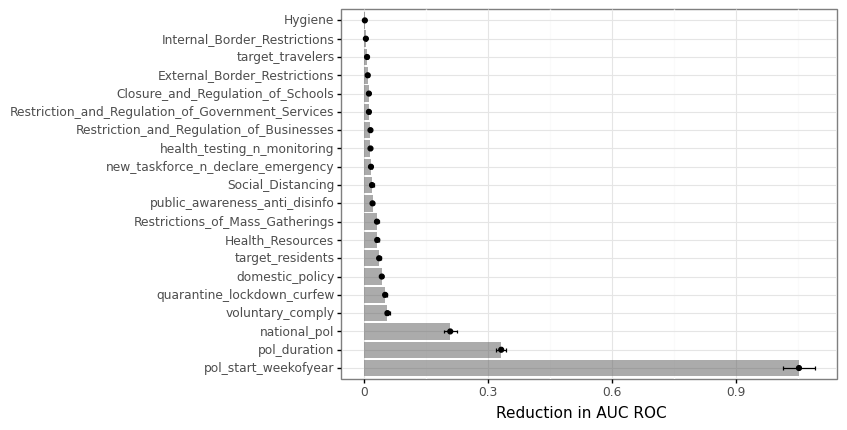

<ggplot: (298741279)>

In [74]:
p

In [75]:
vi1 = permutation_importance(bag_mod1,train_X1,train_y1,n_repeats=20)
# Organize as a data frame 
vi_dat1 = pd.DataFrame(dict(variable=train_X1.columns,
                           vi1 = vi1['importances_mean'],
                           std1 = vi1['importances_std']))

# Generate intervals
vi_dat1['low'] = vi_dat1['vi1'] - 2*vi_dat1['std1']
vi_dat1['high'] = vi_dat1['vi1'] + 2*vi_dat1['std1']

# But in order from most to least important
vi_dat1 = vi_dat1.sort_values(by="vi1",ascending=False).reset_index(drop=True)

# visualize the var importance
p1=(
    ggplot(vi_dat1,
          aes(x="variable",y="vi1")) +
    geom_col(alpha=.5) +
    geom_point() +
    geom_errorbar(aes(ymin="low",ymax="high"),width=.2) +
    theme_bw() +
    scale_x_discrete(limits=vi_dat1.variable.tolist()) +
    coord_flip() +
    labs(y="Reduction in AUC ROC",x="")
)

In [76]:
# check vi_dat dateframe for var imporatance in descending order
vi_dat1

,variable,vi1,std1,low,high
0,pol_start_weekofyear,0.847767,0.014011,0.819745,0.875789
1,pol_duration,0.457653,0.007463,0.442728,0.472578
2,national_pol,0.335933,0.008998,0.317937,0.353930
3,domestic_policy,0.080243,0.003165,0.073913,0.086573
4,voluntary_comply,0.076021,0.004903,0.066214,0.085827
5,target_residents,0.060126,0.003016,0.054093,0.066159
6,quarantine_lockdown_curfew,0.052124,0.002252,0.047619,0.056629
7,Health_Resources,0.040553,0.001848,0.036856,0.044250
8,Restrictions_of_Mass_Gatherings,0.034849,0.001277,0.032295,0.037403
9,Restriction_and_Regulation_of_Businesses,0.029239,0.001558,0.026122,0.032356


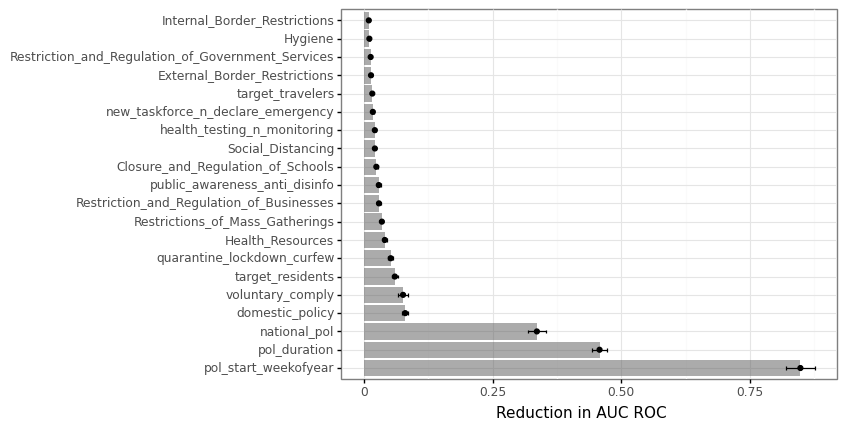

<ggplot: (402901911)>

In [77]:
p1

#### Partial Dependency Plots with `sklearn`
Plot partial dependency plots for the top three most important variables. 

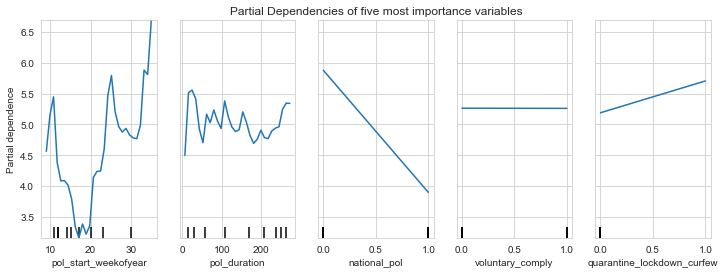

In [638]:
# Target specific features
features = ['pol_start_weekofyear','pol_duration','national_pol','voluntary_comply','quarantine_lockdown_curfew']

# Calculate the partial dependency
fig, ax = plt.subplots(figsize=(12, 4))
display = plot_partial_dependence(
    bag_mod, train_X0, features,n_cols=5,
    n_jobs=4, grid_resolution=30,ax=ax
)
ax.set(title="Partial Dependencies of five most importance variables")

plt.savefig('partialdependency.png', dpi=200, bbox_inches='tight')

### Fixed Effect Model for Panel Data

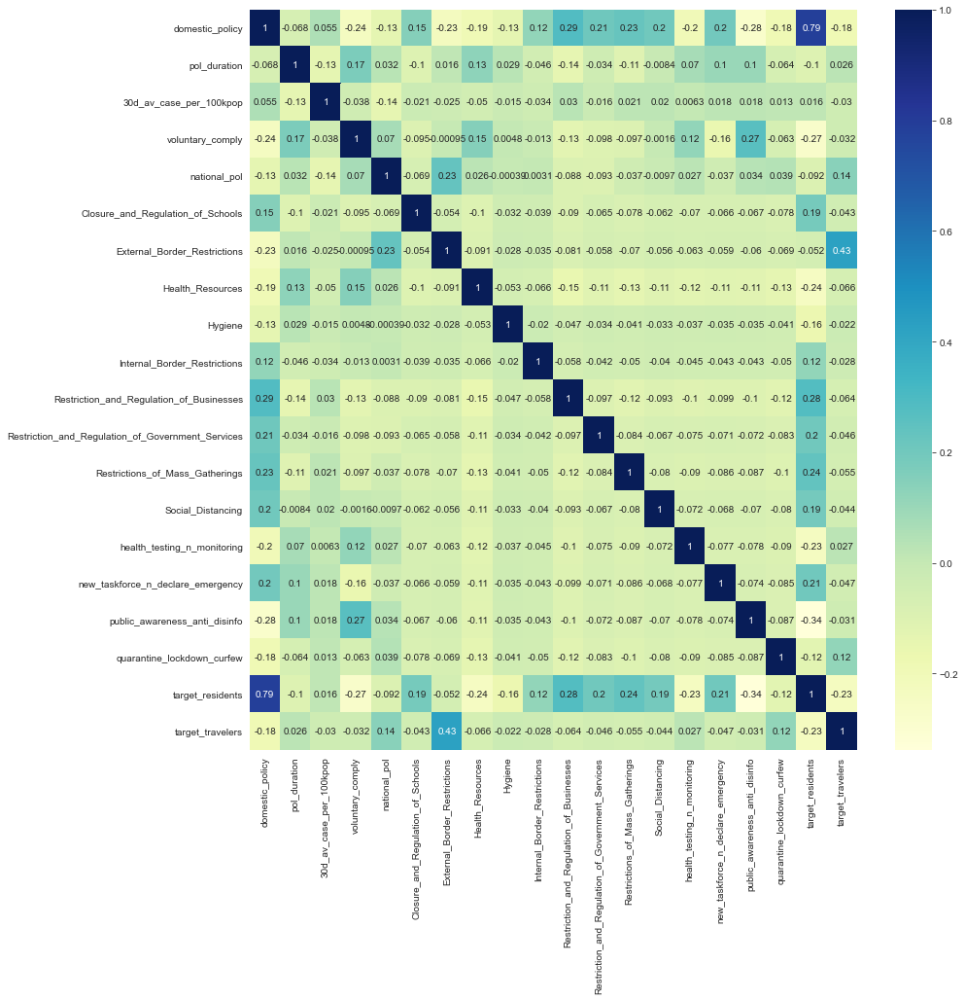

In [576]:
# create a heatmap for the cosine similarities of articles  
fig, ax = plt.subplots(figsize=(14,14))        
sns.heatmap(case.corr().astype(float), annot = True,cmap="YlGnBu")
plt.savefig('corrheatmap.png', dpi=300, bbox_inches='tight')

In [639]:
# import cvs for fixed effect regression!
case = pd.read_csv("../Data/case_fixed_effect.csv", encoding = "ISO-8859-1")

case['country'] = case['country'].astype('category')
case["date_start"] = pd.to_datetime(case["date_start"], format='%Y-%m-%d')

case = case.drop(['Unnamed: 0','target_residents','pol_ongoing'],axis=1).set_index(['country', 'date_start'])

# specification: time fixed effect
exog_vars0 = case.columns.tolist()
exog_vars0.remove('30d_av_case_per_100kpop')
exog0 = add_constant(case[exog_vars0])
mod0 = PanelOLS(case['30d_av_case_per_100kpop'], exog0,time_effects=True)
result0 = mod0.fit(cov_type='clustered', cluster_time=True)
print(result0)

# another specification: country fixed effect
mod1 = PanelOLS(case['30d_av_case_per_100kpop'], exog0,entity_effects=True)
result1 = mod1.fit(cov_type='clustered', cluster_time=True)
print(result1)

                             PanelOLS Estimation Summary                             
Dep. Variable:     30d_av_case_per_100kpop   R-squared:                        0.0387
Estimator:                        PanelOLS   R-squared (Between):             -0.0070
No. Observations:                     9632   R-squared (Within):              -0.0144
Date:                     Sat, Dec 19 2020   R-squared (Overall):              0.0296
Time:                             08:23:33   Log-likelihood                -3.023e+04
Cov. Estimator:                  Clustered                                           
                                             F-statistic:                      20.866
Entities:                               37   P-value                           0.0000
Avg Obs:                            260.32   Distribution:                 F(18,9320)
Min Obs:                            21.000                                           
Max Obs:                            2717.0   F-statist

### Fixed Effect Model for US state analysis

In [169]:
# read in the Covid United States caseload data
us_cases = pd.read_csv("../Data/time_series_covid19_confirmed_US.csv", encoding = "ISO-8859-1")
# drop unuseful columns
us_cases=us_cases.drop(['Lat','code3','Combined_Key','Long_','UID',"iso2",'iso3','FIPS',"Admin2","Country_Region"], axis=1)\
        .reset_index(drop=True)
# calculate each state's total cases 
us_cases = us_cases.groupby(['Province_State']).sum().transpose().reset_index().rename_axis(None,axis=1)


In [180]:
us_daily_new_cases= us_cases.set_index('index').diff().fillna(0)
us_daily_new_cases.tail(4)

,Alabama,Alaska,American Samoa,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Diamond Princess,...,Tennessee,Texas,Utah,Vermont,Virgin Islands,Virginia,Washington,West Virginia,Wisconsin,Wyoming
index,,,,,,,,,,,,,,,,,,,,,
11/27/20,917.0,674.0,0.0,4314.0,1052.0,13774.0,4270.0,3429.0,591.0,0.0,...,4340.0,4439.0,6142.0,178.0,0.0,1544.0,4261.0,866.0,1422.0,1012.0
11/28/20,2119.0,668.0,0.0,4136.0,1349.0,15048.0,4330.0,0.0,500.0,0.0,...,6750.0,6334.0,2043.0,28.0,17.0,3173.0,2467.0,799.0,5473.0,155.0
11/29/20,2236.0,621.0,0.0,3221.0,1221.0,14831.0,3489.0,0.0,581.0,0.0,...,3052.0,11541.0,1722.0,67.0,6.0,2325.0,2066.0,1152.0,4055.0,561.0
11/30/20,2295.0,511.0,0.0,822.0,1112.0,14809.0,4133.0,4714.0,403.0,0.0,...,7975.0,13634.0,1897.0,72.0,0.0,1893.0,2319.0,845.0,2676.0,816.0


In [204]:
# read in United States pop data
us_pop = pd.read_csv("../Data/us_pop.csv", encoding = "ISO-8859-1")
us_pop = us_pop.filter(items=["NAME","POPESTIMATE2019"])\
            .rename(columns={"NAME": "state", "POPESTIMATE2019":"pop"}).iloc[1:] 
us_pop.loc[us_pop['state'] == 'Puerto Rico Commonwealth', ['state']] = 'Puerto Rico'


In [224]:
# calculate one monthly average covid cases from each date on
us_monthav_case = us_daily_new_cases.copy()
for x in range(0,314):
    us_monthav_case.iloc[x] = us_monthav_case[x: x +30].mean().round(4)

# melt the dataframe to make merging convenient 
us_monthav_case = us_monthav_case.reset_index().melt(id_vars = ['index'])\
                    .rename(columns={'variable':"state", "value":"30d_av_case"})

# normalize by 100K population
# merge cases with population of states
us_monthav_case = pd.merge(us_monthav_case, us_pop, how='left', on=['state'])
# convert population to unit of 100k (right now it's unit is one)
us_monthav_case["pop"] = us_monthav_case.apply(lambda row: row["pop"]/100000, axis=1)
# calculate cases per 100k population for each state

us_monthav_case["30d_av_case_per_100kpop"] = us_monthav_case.apply(lambda row: row["30d_av_case"] / row['pop'], axis=1)
us_monthav_case= us_monthav_case.dropna().reset_index(drop=True)



In [238]:
# reprocess us state policy data -- same as the oecd country data

dat_us = dat_oecd_final[dat_oecd_final['country'] == "United States"]

dat_us = dat_us.drop(['policy_id','entry_type','update_level','description','country','city',
                                  'type_sub_cat','institution_status','target_country','target_region',
                                  'target_province','target_city','enforcer','target_geog_level',
                                  'travel_mechanism',"pol_ongoing"], axis=1).rename(columns={"province": "state"})
# convert the timedelta data (policy duration) to int
dat_us["pol_duration"] = dat_us['pol_duration'].map(lambda x: str(x))
dat_us["pol_duration"] = dat_us.pol_duration.str.split(" ",expand=True,)
dat_us["pol_duration"] = dat_us.pol_duration.astype(int)

# combine categoris in compliance var
dat_us.loc[dat_us['compliance'] == 'Mandatory (Unspecified/Implied)', ['compliance']] = 'mandatory_unspecified'
dat_us.loc[dat_us['compliance'] == 'Voluntary/Recommended but No Penalties', ['compliance']] = 'voluntary'
dat_us["compliance"] = dat_us.compliance.str.split(" ",expand=True,)
dat_us.loc[dat_us['compliance'] == 'Mandatory', ['compliance']] = 'mandatory_with_penalty'

# combine categoris in target_who_what var
dat_us.loc[dat_us['target_who_what'].str.contains("Residents",na=False), ['target_who_what']] = 'residents'
dat_us.loc[dat_us['target_who_what'].str.contains("Travelers",na=False), ['target_who_what']] = 'travelers'
dat_us.loc[dat_us['target_who_what'].str.contains("Health",na=False), ['target_who_what']] = 'health_supply_stuff'

# convert object to categories
for col in ['init_country_level', 'type', 'target_who_what', 'target_direction','compliance']:
    dat_us[col] = dat_us[col].astype('category')

# drop the target_direction column due to large missingness
# drop index_med_est because data only available to April 29
dat_us = dat_us.drop(["target_direction","index_med_est"], axis=1).\
                set_index(['state','date_start']).sort_index().reset_index()
# assume the lagged effect of policy for covid cases is three weeks and the lagged effect for deaths is four weeks
dat_us["lagged_case_date"]=dat_us.apply(lambda row: row.date_start + timedelta(weeks=3), axis=1)
dat_us["lagged_death_date"]=dat_us.apply(lambda row: row.date_start + timedelta(weeks=4), axis=1)
dat_us = dat_us[dat_us['state'].notna()]
dat_us.loc[dat_us['state'] == 'Washington, D.C.', ['state']] = 'District of Columbia'

# merge the case data onto dat_us
us_monthav_case1 = us_monthav_case.rename(columns={'index':"lagged_case_date"})\
                    .drop(["pop", "30d_av_case"], axis=1)
us_monthav_case1["lagged_case_date"] = pd.to_datetime(us_monthav_case1["lagged_case_date"], format='%m/%d/%y')

dat_us = pd.merge(dat_us,us_monthav_case1, how='left', on=['state','lagged_case_date'])
dat_us = dat_us.drop(["lagged_case_date", "lagged_death_date"], axis=1)\
                    .dropna(subset=['30d_av_case_per_100kpop'])

##################Preprocessing#################

# set dummy for categoris in compliance var
dat_us['voluntary_comply'] = 1*(dat_us['compliance'] == "voluntary")
# Everything else ("mandatory_with_penalty", "mandatory_unspecified") is the baseline. 
# Drop compliance
dat_us = dat_us.drop(columns=["compliance"])

# set dummy for state-substate(municipal,county) policy var
dat_us['state_pol'] = 1*(dat_us['init_country_level'] == "Provincial")
# Everyone else ("municipal", "provincial", "other(county)", NaN) is the baseline. 
# Drop init_country_level
dat_us = dat_us.drop(columns=["init_country_level"])


dat_us = dat_us.reset_index(drop=True)

# combine categoris in type var:
list1=["Health Monitoring","Health Testing"]
dat_us['type']= np.where(dat_us['type'].isin(list1), 'health_testing_n_monitoring', dat_us['type'])

list2=["Public Awareness Measures","Anti-Disinformation Measures"]
dat_us['type']= np.where(dat_us['type'].isin(list2), 'public_awareness_anti_disinfo', dat_us['type'])

list3=["Quarantine","Lockdown","Curfew"]
dat_us['type']= np.where(dat_us['type'].isin(list3), 'quarantine_lockdown_curfew', dat_us['type'])

list4=["New Task Force, Bureau or Administrative Configuration", "Declaration of Emergency"]
dat_us['type']= np.where(dat_us['type'].isin(list4), 'new_taskforce_n_declare_emergency', dat_us['type'])

# convert to dummies
type_dummies = pd.get_dummies(dat_us.type)

# set "Other Policy Not Listed Above" as the Baseline
type_dummies = type_dummies.drop(['Other Policy Not Listed Above'],axis=1)
type_dummies.columns= type_dummies.columns.str.replace(' ', '_')
# replace Marital column with mar_dummies 
dat_us = pd.concat([dat_us,type_dummies],axis=1)
dat_us = dat_us.drop(['type'],axis=1)

dat_us['target_residents'] = 1*(dat_us["target_who_what"] == "residents")
dat_us['target_travelers'] = 1*(dat_us["target_who_what"] == "travelers")
# Everyone else ("other" and "health_supply_stuff") is the baseline. 
# Drop target_who_what
dat_us = dat_us.drop(columns=["target_who_what"])



In [580]:
# fixed effect model for us!
us_pol_case = dat_us.copy()
us_pol_case['state'] = us_pol_case['state'].astype('category')

us_pol_case=us_pol_case.drop(['date_end'],axis=1).set_index(['state', 'date_start'])

# specification: time fixed effect
exog_vars1 = us_pol_case.columns.tolist()
exog_vars1.remove('30d_av_case_per_100kpop')
exog_vars1.remove('target_residents')
exog1 = add_constant(us_pol_case[exog_vars1])
mod2 = PanelOLS(us_pol_case['30d_av_case_per_100kpop'], exog1,time_effects=True)
result2 = mod2.fit(cov_type='clustered', cluster_time=True)
print(result2)

# another specification: country fixed effect
mod3 = PanelOLS(us_pol_case['30d_av_case_per_100kpop'], exog1, entity_effects=True)
result3 = mod3.fit(cov_type='clustered', cluster_time=True)
print(result3)


                             PanelOLS Estimation Summary                             
Dep. Variable:     30d_av_case_per_100kpop   R-squared:                        0.0232
Estimator:                        PanelOLS   R-squared (Between):              0.0338
No. Observations:                     2634   R-squared (Within):              -0.0115
Date:                     Fri, Dec 18 2020   R-squared (Overall):              0.0022
Time:                             19:52:20   Log-likelihood                   -8916.1
Cov. Estimator:                  Clustered                                           
                                             F-statistic:                      3.1572
Entities:                               52   P-value                           0.0000
Avg Obs:                            50.654   Distribution:                 F(18,2389)
Min Obs:                            3.0000                                           
Max Obs:                            163.00   F-statist

#### Non-US OECD country fixed effects

In [ ]:
# import cvs for fixed effect regression!
case = pd.read_csv("../Data/case_fixed_effect.csv", encoding = "ISO-8859-1")

case['country'] = case['country'].astype('category')
case["date_start"] = pd.to_datetime(case["date_start"], format='%Y-%m-%d')

case_nous = case[case.country != 'United States']
case_nous = case_nous.drop(['Unnamed: 0','pol_ongoing'],axis=1).set_index(['country', 'date_start'])

# specification: time fixed effect
exog_vars2 = case_nous.columns.tolist()
exog_vars2.remove('30d_av_case_per_100kpop')
exog2 = add_constant(case_nous[exog_vars2])
mod4 = PanelOLS(case_nous['30d_av_case_per_100kpop'], exog2,time_effects=True)
result4 = mod4.fit(cov_type='clustered', cluster_time=True)


# another specification: country fixed effect
mod5 = PanelOLS(case_nous['30d_av_case_per_100kpop'], exog2, entity_effects=True)
result5 = mod5.fit(cov_type='clustered', cluster_time=True)


### Fixed effect: Economic (GDP & Unemployment) ~ Policy incidence (quarterly cumulative) + Case (quarterly cumulative) 

In [425]:
quart_pol = oecd_clean.filter(items=['country', 'date_start','type','init_country_level','compliance'])
quart_pol['pol_start_quarter'] = quart_pol['date_start'].dt.quarter

# set dummy for categoris in compliance var
quart_pol['voluntary_comply'] = 1*(quart_pol['compliance'] == "voluntary")
# Everything else ("mandatory_with_penalty", "mandatory_unspecified") is the baseline. 
# Drop compliance
quart_pol = quart_pol.drop(columns=["compliance"])

# set dummy for national-subnational(state, municipal,county) policy var
quart_pol['national_pol'] = 1*(quart_pol['init_country_level'] == "National")
# Everyone else ("municipal", "provincial", "other(county)", NaN) is the baseline. 
# Drop init_country_level
quart_pol = quart_pol.drop(columns=["init_country_level"]).set_index(['country','date_start']).sort_index().reset_index()

# calculate number of new policy in each quarter by country
quart_pol["quarter_pol_cumulate"]= quart_pol.groupby(['country','pol_start_quarter']).cumcount()

quart_pol = quart_pol.drop(quart_pol.tail(1).index).filter(items=['country', 'pol_start_quarter','quarter_pol_cumulate'])
quart_pol = quart_pol.groupby(['country','pol_start_quarter'])

quart_pol = pd.concat([quart_pol.tail(1)]).reset_index(drop=True)
quart_pol = quart_pol.rename(columns={"pol_start_quarter": "quarter"})

# normalize by 100K population
# merge cases with population of countries
quart_pol = pd.merge(quart_pol,pop, how='left', on=['country'])
# convert population to unit of 100k (right now it's unit is million)
quart_pol["population"] =quart_pol["population"]*10 
# calculate cases per 100k population for each country
quart_pol["quarter_pol_cumulate"] = quart_pol.apply(lambda row: row["quarter_pol_cumulate"] / row['population'], axis=1)
quart_pol= quart_pol.filter(items=['country', 'quarter','quarter_pol_cumulate'])



,country,quarter,quarter_pol_cumulate
0,Australia,1,0.684195
1,Australia,2,0.480137
2,Australia,3,0.240069
3,Australia,4,0.032009
4,Austria,1,0.531812
...,...,...,...
114,United Kingdom,4,0.006021
115,United States,1,0.361589
116,United States,2,0.384513
117,United States,3,0.065104


In [426]:
quarter_new_case = daily_new_cases.copy()
quarter_new_case = quarter_new_case.reset_index()
quarter_new_case["index"] = pd.to_datetime(quarter_new_case["index"], format='%m/%d/%y')
quarter_new_case['quarter'] = quarter_new_case['index'].dt.quarter
quarter_new_case = quarter_new_case.drop(['index'], axis=1).melt(id_vars = ['quarter'])\
                        .rename(columns={'variable':"country", "value":"quarter_case"})
quarter_new_case = quarter_new_case.groupby(['country','quarter']).sum().reset_index()


# normalize by 100K population
# merge cases with population of countries
quarter_new_case = pd.merge(quarter_new_case,pop, how='left', on=['country'])
# convert population to unit of 100k (right now it's unit is million)
quarter_new_case["population"] =quarter_new_case["population"]*10 
# calculate cases per 100k population for each country
quarter_new_case["quarter_case"] = quarter_new_case.apply(lambda row: row["quarter_case"] / row['population'], axis=1)
quarter_new_case= quarter_new_case.filter(items=['country', 'quarter','quarter_case'])

quarter_new_case

,country,quarter,quarter_case
0,Australia,1,18.241210
1,Australia,2,13.447841
2,Australia,3,76.725913
3,Australia,4,3.264932
4,Austria,1,115.188250
...,...,...,...
143,United Kingdom,4,1770.728172
144,United States,1,58.739343
145,United States,2,744.770642
146,United States,3,1402.715406


In [427]:
unemploy_change = quart_dat.copy()
unemploy_change = unemploy_change.filter(items=['Country', 'unemployment_rate','quarter','year'])\
                        .rename(columns={"Country": "country",'unemployment_rate':'unemploy_change_year'})

unemploy_change['year'] = unemploy_change['year'].astype('int')
unemploy_change['unemploy_change_year'] = unemploy_change['unemploy_change_year'].diff(periods=4)
unemploy_change = unemploy_change[unemploy_change['year'] == 2020].dropna().reset_index(drop=True)
unemploy_change['quarter'] = unemploy_change['quarter'].str[1:].astype('int')
unemploy_change=pd.merge(unemploy_change, quarter_new_case, how="left", on=["country",'quarter'])
unemploy_change=pd.merge(unemploy_change, quart_pol,how="left", on=["country",'quarter'])
unemploy_change= unemploy_change.drop(['year'], axis=1).set_index(['country', 'quarter']).fillna(0)

In [428]:
gdp_change = quart_dat.copy()
gdp_change= gdp_change.filter(items=['Country', 'GDP_growth_rate_change_year','quarter','year'])\
                        .rename(columns={"Country": "country"})

gdp_change['year'] = gdp_change['year'].astype('int')

gdp_change = gdp_change[gdp_change['year'] == 2020].dropna().reset_index(drop=True)
gdp_change['quarter'] = gdp_change['quarter'].str[1:].astype('int')

gdp_change=pd.merge(gdp_change, quarter_new_case, how="left", on=["country",'quarter'])
gdp_change=pd.merge(gdp_change, quart_pol,how="left", on=["country",'quarter'])

gdp_change= gdp_change.drop(['year'], axis=1).set_index(['country', 'quarter']).fillna(0)


<AxesSubplot:>

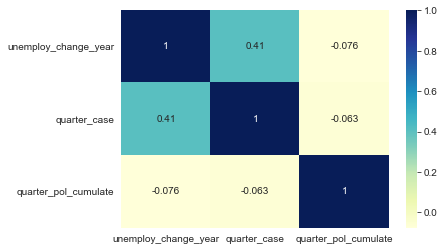

In [688]:
sns.heatmap(unemploy_change.corr().astype(float), annot = True,cmap="YlGnBu")

<AxesSubplot:>

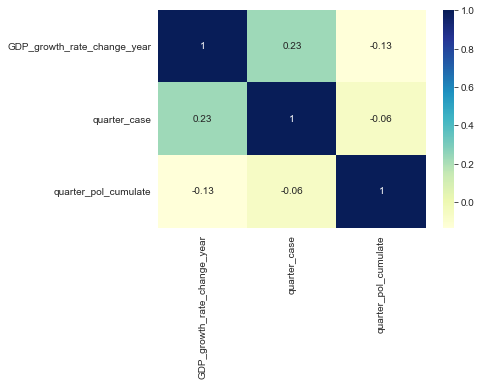

In [689]:
sns.heatmap(gdp_change.corr().astype(float), annot = True,cmap="YlGnBu")

In [693]:
# specification: PooledOLS: F-test fail to reject the poolability null

exog_vars3 = gdp_change.columns.tolist()
exog_vars3.remove('GDP_growth_rate_change_year')
exog3 = add_constant(gdp_change[exog_vars3])
mod6 = PanelOLS(gdp_change['GDP_growth_rate_change_year'], exog3,time_effects=True)
result6 = mod6.fit()
print(result6)


                               PanelOLS Estimation Summary                               
Dep. Variable:     GDP_growth_rate_change_year   R-squared:                        0.0060
Estimator:                            PanelOLS   R-squared (Between):             -0.1225
No. Observations:                           98   R-squared (Within):              -0.0079
Date:                         Sat, Dec 19 2020   R-squared (Overall):             -0.0160
Time:                                 12:23:26   Log-likelihood                   -259.14
Cov. Estimator:                     Unadjusted                                           
                                                 F-statistic:                      0.2829
Entities:                                   37   P-value                           0.7543
Avg Obs:                                2.6486   Distribution:                    F(2,93)
Min Obs:                                2.0000                                           
Max Obs:  

In [692]:
# specification: country fixed effect

exog_vars4 = unemploy_change.columns.tolist()
exog_vars4.remove('unemploy_change_year')
exog4 = add_constant(unemploy_change[exog_vars4])
mod7 = PanelOLS(unemploy_change['unemploy_change_year'], exog4, time_effects=True)
result7 = mod7.fit()
print(result7)

                           PanelOLS Estimation Summary                            
Dep. Variable:     unemploy_change_year   R-squared:                        0.1026
Estimator:                     PanelOLS   R-squared (Between):              0.1614
No. Observations:                   105   R-squared (Within):               0.1612
Date:                  Sat, Dec 19 2020   R-squared (Overall):              0.1602
Time:                          12:23:11   Log-likelihood                   -205.43
Cov. Estimator:              Unadjusted                                           
                                          F-statistic:                      5.7137
Entities:                            37   P-value                           0.0045
Avg Obs:                         2.8378   Distribution:                   F(2,100)
Min Obs:                         2.0000                                           
Max Obs:                         3.0000   F-statistic (robust):             5.7137
    

### Plot!!

In [471]:
temp_q2_case = quarter_new_case[quarter_new_case['quarter'].isin([1,2])]
temp_q2_case = temp_q2_case.drop(['quarter'],axis=1).groupby('country').sum().reset_index()\
                        .rename(columns={"quarter_case": "q2_cum_case"})

In [448]:
temp_q3_case = quarter_new_case[quarter_new_case['quarter'].isin([1,2,3])]
temp_q3_case = temp_q3_case.drop(['quarter'],axis=1).groupby('country').sum().reset_index()\
                        .rename(columns={"quarter_case": "q3_cum_case"})




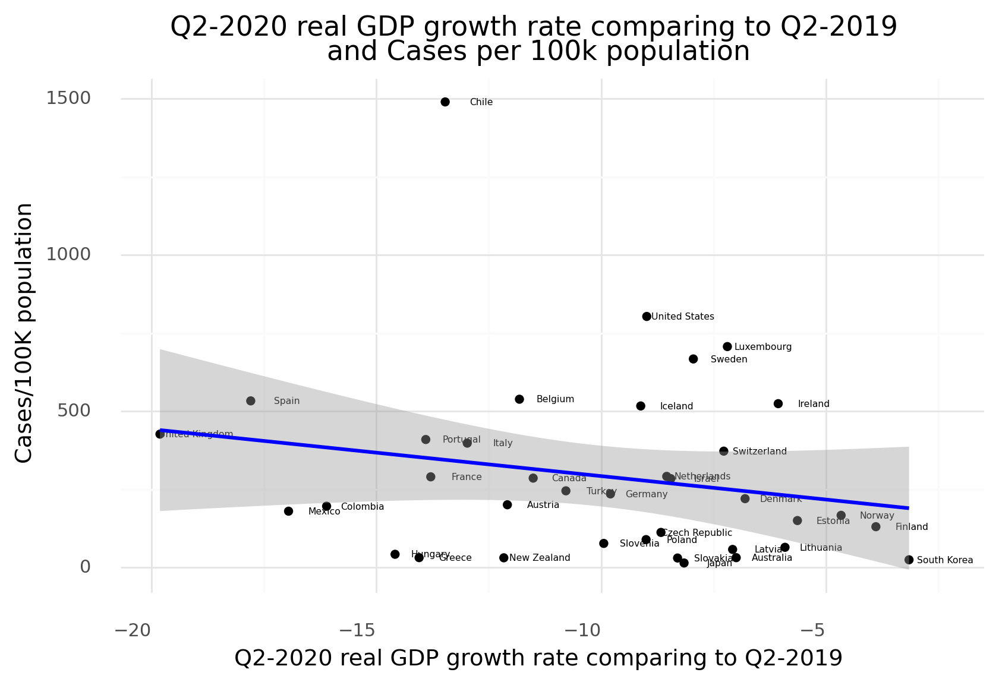

<ggplot: (625646291)>

In [710]:
econ_health = quart_dat[quart_dat["quarter"]=="Q2"]
econ_health = econ_health[econ_health["year"]=="2020"]
econ_health = econ_health.reset_index(drop=True).rename(columns={"Country": "country"}) 
econ_health = pd.merge(econ_health,temp_q2_case, how='left', on=['country'])
(
    ggplot(econ_health,
          aes(x="GDP_growth_rate_change_year",y="q2_cum_case")) +
    geom_point() +
    geom_text(aes(label='country'), size=4.5, position = position_nudge(x=0.8, y =-1.7))+
    geom_smooth(method='lm',color="blue") +
    labs(x="Q2-2020 real GDP growth rate comparing to Q2-2019",y="Cases/100K population") +
    theme_minimal() +
    ggtitle("Q2-2020 real GDP growth rate comparing to Q2-2019 \nand Cases per 100k population")+
    theme(dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1)) 

)

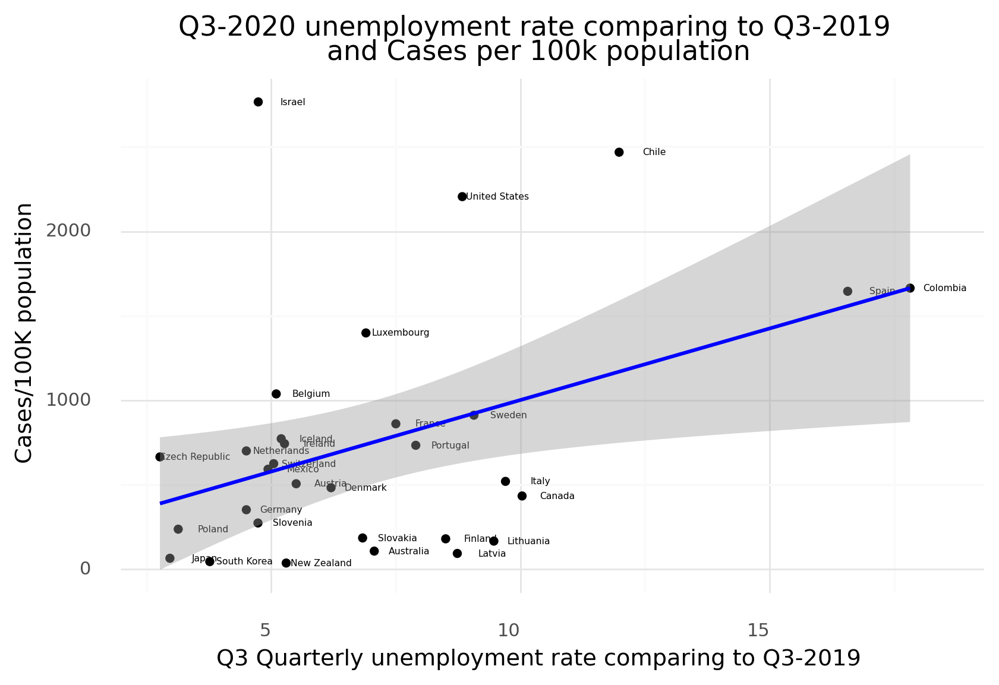

<ggplot: (509270086)>

In [521]:
econ_health1 = quart_dat[quart_dat["quarter"]=="Q3"]
econ_health1 = econ_health1[econ_health1["year"]=="2020"]
econ_health1 = econ_health1.reset_index(drop=True).rename(columns={"Country": "country"})
econ_health1 = pd.merge(econ_health1,temp_q3_case, how='left', on=['country'])
(
    ggplot(econ_health1,
          aes(x="unemployment_rate",y="q3_cum_case")) +
    geom_point() +
    geom_text(aes(label='country'), size=4.5, position = position_nudge(x=0.7, y =-1.7))+
    labs(x="Q3 Quarterly unemployment rate comparing to Q3-2019",y="Cases/100K population") +
    theme_minimal() +
    ggtitle("Q3-2020 unemployment rate comparing to Q3-2019 \nand Cases per 100k population")+
    geom_smooth(method='lm',color="blue") +
    theme(legend_position = "none", 
          dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1))
)

In [719]:
temp_q2_pol = quart_pol[quart_pol['quarter'].isin([1,2])]
temp_q2_pol = temp_q2_pol.drop(['quarter'],axis=1).groupby('country').sum().reset_index()\
                        .rename(columns={"quarter_pol_cumulate": "q2_cum_pol"})

In [497]:
temp_q3_pol = quart_pol[quart_pol['quarter'].isin([1,2,3])]
temp_q3_pol = temp_q3_pol.drop(['quarter'],axis=1).groupby('country').sum().reset_index()\
                        .rename(columns={"quarter_pol_cumulate": "q3_cum_pol"})

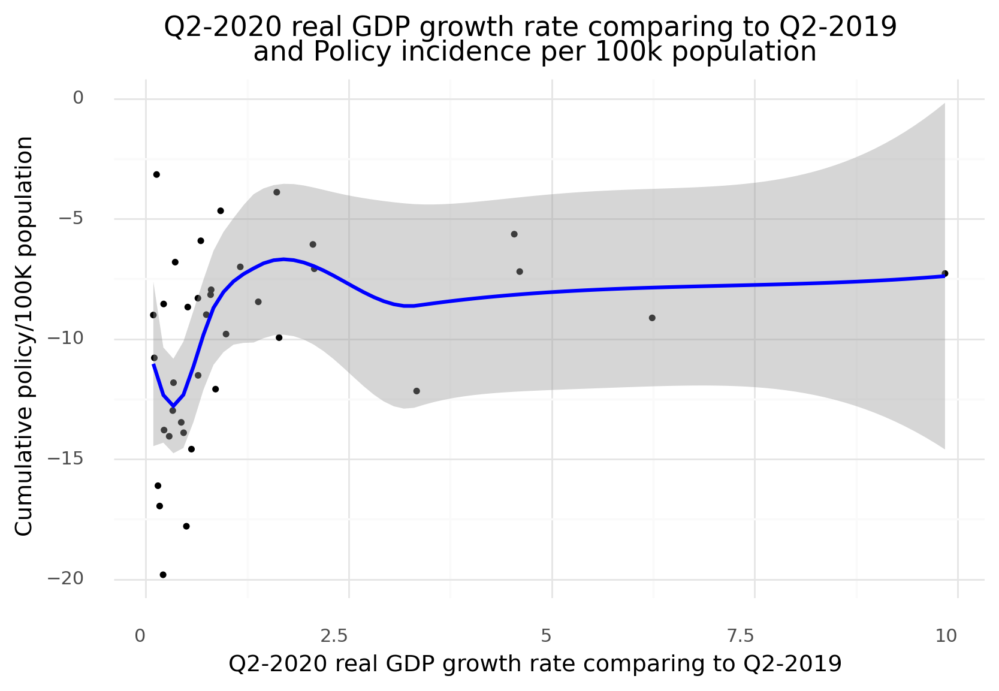

<ggplot: (633479295)>

In [723]:
econ_health = quart_dat[quart_dat["quarter"]=="Q2"]
econ_health = econ_health[econ_health["year"]=="2020"]
econ_health = econ_health.reset_index(drop=True).rename(columns={"Country": "country"}) 
econ_health = pd.merge(econ_health,temp_q2_pol, how='left', on=['country'])

p=(
    ggplot(econ_health,
          aes(x="q2_cum_pol",y="GDP_growth_rate_change_year")) +
    geom_point(size =0.8) +
    geom_smooth(method='loess',color="blue") +
    labs(x="Q2-2020 real GDP growth rate comparing to Q2-2019",y="Cumulative policy/100K population") +
    theme_minimal() +
    ggtitle("Q2-2020 real GDP growth rate comparing to Q2-2019 \nand Policy incidence per 100k population")+
    theme(dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1)) 

)
p

In [711]:


econ_health.to_csv("../Data/econ_health.csv")

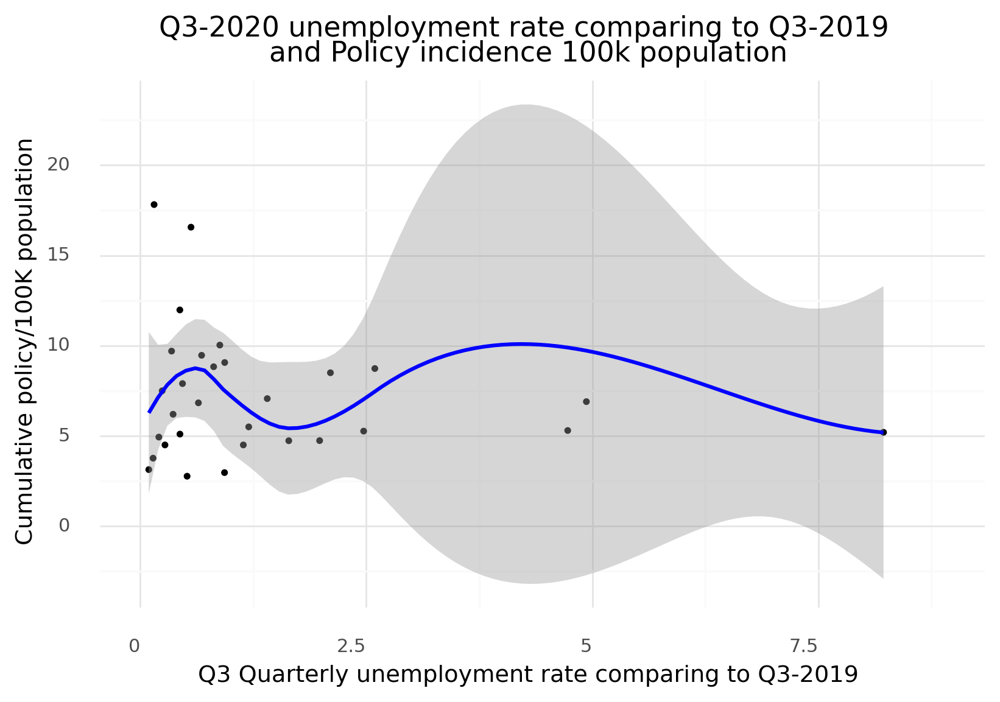

<ggplot: (632437044)>

In [725]:
econ_health1 = quart_dat[quart_dat["quarter"]=="Q3"]
econ_health1 = econ_health1[econ_health1["year"]=="2020"]
econ_health1 = econ_health1.reset_index(drop=True).rename(columns={"Country": "country"})
econ_health1 = pd.merge(econ_health1,temp_q3_pol, how='left', on=['country'])
(
    ggplot(econ_health1,
          aes(x="q3_cum_pol",y="unemployment_rate")) +
    geom_point(size =0.8) +
    labs(x="Q3 Quarterly unemployment rate comparing to Q3-2019",y="Cumulative policy/100K population") +
    theme_minimal() +
    xlim(0,8.9)+
    ggtitle("Q3-2020 unemployment rate comparing to Q3-2019 \nand Policy incidence 100k population")+
    geom_smooth(method='loess',color="blue") +
    theme(legend_position = "none", 
          dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1))
)


In [728]:

# merge pol_count with covid cases
temp_polcount = pd.merge(temp_q3_pol, temp_q3_case,how='left', on=['country'])
p10 = (
    ggplot(temp_polcount,
          aes(x="q3_cum_pol",y="q3_cum_case")) +
    geom_point(size =0.8) +
    labs(x="Cumalative policy incidences/100K population",y="Cumalative cases/100K population") +
    theme_minimal() +
    ggtitle("Cumalative policy incidences and Covid-19 Cases, per 100k population")+
    geom_smooth(method='loess',color="blue") +
    theme(legend_position = "none", 
          dpi=250, figure_size=(7.5,4.5), axis_text_x=element_text(hjust=1))
)                    

ggsave(plot=p10, filename='pol_case.png', dpi=300, limitsize=False)

In [ ]:
fig,axes =  plt.subplots(2, 2, figsize=(10, 6), sharex=True, sharey=True)
sns.set_style("darkgrid")
fig.suptitle('Cumulative incidence of 4 policy event types over time',fontsize=22)


l1=sns.lineplot(data=policy_occur[policy_occur.type=='Health Resources'], 
                x='date_start', y='cumcount',ax=axes[0,0],label="Health Resources")
l2=sns.lineplot(data=policy_occur[policy_occur.type=='Restriction and Regulation of Businesses'],  
                x='date_start', y='cumcount',color="red",ax=axes[0,1],label='Restriction and Regulation of Businesses')
l3=sns.lineplot(data=policy_occur[policy_occur.type=='Restrictions of Mass Gatherings'], 
                x='date_start', y='cumcount', color="green", ax=axes[1,0],label='Restrictions of Mass Gatherings')
l4=sns.lineplot(data=policy_occur[policy_occur.type=='Closure and Regulation of Schools'],  
                x='date_start', y='cumcount', color="orange", ax=axes[1,1],label='Closure and Regulation of Schools')

lines_labels = [ax.get_legend_handles_labels() for ax in fig.axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]

# Create the legend
fig.legend(lines,     # The line objects   
           labels,
           loc="center left",bbox_to_anchor=(1, 0.5),   # Position of legend
           borderaxespad=0.1,    # Small spacing around legend box
           title="Policy Type"  # Title for the legend
           )


In [603]:
temp_polcount 

,country,q3_cum_pol,q3_cum_case
0,Australia,1.404401,108.414963
1,Austria,1.199406,507.065917
2,Belgium,0.438453,1038.711861
3,Canada,0.879682,434.732794
4,Chile,0.437301,2469.100315
5,Colombia,0.152506,1664.877402
6,Czech Republic,0.517577,665.915082
7,Denmark,0.362697,483.561450
8,Estonia,6.581052,254.996872
9,Finland,2.103154,181.161358
